<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;">
 

<strong>Objectives:</strong>
+ Variables significativas para el clustering de productos
    
    
<strong>Conclusions:</strong>

   
</div>

In [16]:
import os, sys

def get_root_path(search_word):
    """ Búsqueda hacia atrás de un directorio con nombre search_word. """
    cwd = os.getcwd()
    while str(os.getcwd()).split('/')[-1] != search_word:
        os.chdir("..")
        cwd = os.getcwd()
    return cwd

ROOT_DIR = get_root_path('TFM_StockForecast')

sys.path.insert(0, ROOT_DIR) # Poner en el primer lugar del PATH (evitar paquetes con mismos nombres en otros directorios)

In [17]:
import pandas as pd
import numpy as np
from src.load_data import load_clustering_data, load_data
from src.trainer_clustering import get_pca_components, plot_cluster, train_DBSCAN, search_best
import matplotlib.pyplot as plt
import seaborn as sns

In [18]:
main_df = load_data()

===================  LOAD DATASET stock ====================
Reading CSV in data/raw/03_TablaStock.csv...
=============  CLEAN CSV  ==============
Set columns to lowcase.
Sort values by date.
Dropped duplicates. Rows dropped: 628.
============  CLEAN STOCK  =============
Dropped rows with data from products with no stock data or out-of-date (descatalogados). Rows dropped: 1082
[WARNING] Number of dates missings:                                83
[WARNING] Number of dates missings (droping sundays and festivos): 63
[WARNING] Stock data with different units for same product & data. Rows: 13017
Dataset stock loaded. Shape: (26220, 3)

===================  LOAD DATASET ventas ===================
Reading CSV in data/raw/01_TablaVentas.csv...
=============  CLEAN CSV  ==============
Set columns to lowcase.
Sort values by date.
Dropped duplicates. Rows dropped: 0.
============  CLEAN VENTAS  ============
Dropped rows with data from products with no stock data or out-of-date (descatalogados). 

/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/create_variables.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ts['missing'] = (ts.udsstock.isna()) * 1
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/create_variables.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  day_data["roll4wd_" + col] = day_data.loc[(day_data.festivo == 0), col].rolling(4, win_type='triang', min_periods=1).mean()
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/create_va

Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for

Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last

Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and 

Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

In [19]:
df = load_clustering_data()
df.head()

===================  LOAD DATASET stock ====================
Reading CSV in data/raw/03_TablaStock.csv...
=============  CLEAN CSV  ==============
Set columns to lowcase.
Sort values by date.
Dropped duplicates. Rows dropped: 628.
============  CLEAN STOCK  =============
Dropped rows with data from products with no stock data or out-of-date (descatalogados). Rows dropped: 1082
[WARNING] Number of dates missings:                                83
[WARNING] Number of dates missings (droping sundays and festivos): 63
[WARNING] Stock data with different units for same product & data. Rows: 13017
Dataset stock loaded. Shape: (26220, 3)

===================  LOAD DATASET ventas ===================
Reading CSV in data/raw/01_TablaVentas.csv...
=============  CLEAN CSV  ==============
Set columns to lowcase.
Sort values by date.
Dropped duplicates. Rows dropped: 0.
============  CLEAN VENTAS  ============
Dropped rows with data from products with no stock data or out-of-date (descatalogados). 

Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for

Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and 

Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last

Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by product and weekday for column udsprevisionempresa
Get stock missing type
Getting rolling windows of last 5 days by product and weekday for column udsventa
Getting rolling windows of last 5 days by product and weekday for column udsstock
Getting rolling windows of last 5 days by 

Dataset ventas by product builded



,producto,fecha_min,fecha_max,frecuencia,intermitencia,venta_min,venta_q5,venta_q25,venta_median,venta_q75,...,venta_kurtosis,venta_mad,aug_ratio,wd_ratio_3,wd_ratio_4,wd_ratio_5,wd_ratio_6,wd_ratio_7,wd_ratio_1,wd_ratio_2
0,1,2019-06-05,2020-03-21,224,112358.744395,0.0,0.0,472.0,1889.0,6140.00,...,15.050234,3784.991603,0.963964,0.767457,2.232604,1.190459,0.153996,0.0,1.810698,0.860774
1,10,2019-06-05,2020-03-20,195,128709.278351,0.0,0.0,0.0,1792.5,3032.50,...,0.586530,1398.386400,0.701511,1.175611,2.090088,1.885536,0.000000,0.0,0.921395,0.923680
2,11,2019-06-05,2020-03-21,227,110867.256637,0.0,0.0,551.0,1653.0,2755.00,...,34.470112,1393.291518,0.578454,0.994103,1.363705,2.090199,0.560776,0.0,0.985710,1.005293
3,12,2019-06-05,2020-03-21,235,107076.923077,0.0,0.0,469.5,870.0,1283.75,...,6.426522,504.840683,0.689417,1.149821,1.506559,1.558032,0.887718,0.0,0.962776,0.932603
4,13,2019-06-05,2020-03-20,195,128709.278351,0.0,0.0,0.0,1549.0,2442.50,...,-0.589084,1091.281174,0.762283,1.125007,2.087554,1.850072,0.000000,0.0,0.973420,0.962418


In [20]:
df.describe()

,frecuencia,intermitencia,venta_min,venta_q5,venta_q25,venta_median,venta_q75,venta_q95,venta_max,venta_iqr,...,venta_kurtosis,venta_mad,aug_ratio,wd_ratio_3,wd_ratio_4,wd_ratio_5,wd_ratio_6,wd_ratio_7,wd_ratio_1,wd_ratio_2
count,72.000000,72.000000,72.0,72.0,72.000000,72.000000,72.000000,72.000000,72.000000,72.000000,...,72.000000,72.000000,72.000000,72.000000,72.000000,72.000000,72.000000,72.000000,72.000000,72.000000
mean,221.347222,111511.695981,0.0,0.0,249.138889,809.444444,1258.690972,1978.272917,5436.236111,1009.552083,...,5.243009,576.911261,0.701977,1.187177,1.347131,1.694003,0.465598,0.007651,1.188545,1.117174
std,31.319867,8887.619186,0.0,0.0,405.502108,760.089939,1211.143391,2013.789905,8385.498578,1001.665064,...,11.944850,606.930006,0.222429,0.183523,0.255651,0.240250,0.371577,0.016304,0.378560,0.171599
min,14.000000,103966.804979,0.0,0.0,0.000000,0.000000,0.000000,0.000000,66.000000,0.000000,...,-1.314003,12.728162,0.000000,0.703444,0.775543,1.190459,0.000000,0.000000,0.459427,0.791527
25%,209.500000,106296.219035,0.0,0.0,0.000000,298.500000,432.250000,718.200000,1533.500000,367.937500,...,0.219355,208.046978,0.583862,1.096798,1.214751,1.553099,0.055423,0.000000,0.987462,1.003716
50%,234.500000,107076.923077,0.0,0.0,87.125000,553.000000,866.750000,1339.225000,2561.500000,702.375000,...,1.271559,379.032042,0.681501,1.172168,1.340576,1.678191,0.487120,0.000043,1.145110,1.066152
75%,236.250000,113375.565611,0.0,0.0,297.562500,1006.000000,1478.500000,2228.000000,5106.250000,1178.687500,...,3.888338,671.513763,0.765544,1.268570,1.425895,1.843972,0.819821,0.002788,1.504412,1.209828
max,242.000000,133276.595745,0.0,0.0,2067.750000,4132.000000,6140.000000,12232.800000,41564.000000,5668.000000,...,79.935774,3784.991603,2.038957,1.703964,2.232604,2.369764,1.164029,0.057507,1.930539,1.618719


In [21]:
df.head()

,producto,fecha_min,fecha_max,frecuencia,intermitencia,venta_min,venta_q5,venta_q25,venta_median,venta_q75,...,venta_kurtosis,venta_mad,aug_ratio,wd_ratio_3,wd_ratio_4,wd_ratio_5,wd_ratio_6,wd_ratio_7,wd_ratio_1,wd_ratio_2
0,1,2019-06-05,2020-03-21,224,112358.744395,0.0,0.0,472.0,1889.0,6140.00,...,15.050234,3784.991603,0.963964,0.767457,2.232604,1.190459,0.153996,0.0,1.810698,0.860774
1,10,2019-06-05,2020-03-20,195,128709.278351,0.0,0.0,0.0,1792.5,3032.50,...,0.586530,1398.386400,0.701511,1.175611,2.090088,1.885536,0.000000,0.0,0.921395,0.923680
2,11,2019-06-05,2020-03-21,227,110867.256637,0.0,0.0,551.0,1653.0,2755.00,...,34.470112,1393.291518,0.578454,0.994103,1.363705,2.090199,0.560776,0.0,0.985710,1.005293
3,12,2019-06-05,2020-03-21,235,107076.923077,0.0,0.0,469.5,870.0,1283.75,...,6.426522,504.840683,0.689417,1.149821,1.506559,1.558032,0.887718,0.0,0.962776,0.932603
4,13,2019-06-05,2020-03-20,195,128709.278351,0.0,0.0,0.0,1549.0,2442.50,...,-0.589084,1091.281174,0.762283,1.125007,2.087554,1.850072,0.000000,0.0,0.973420,0.962418


# PCA representation

In [42]:
from sklearn.decomposition import PCA

data_pca = df.drop(["fecha_min","fecha_max"], axis=1)

columns = data_pca.columns
pca = PCA(2).fit(data_pca)
explained_variance = pca.explained_variance_ratio_
pca_data = pca.transform(data_pca)

explained_variance.sum()

0.9871212625882034

In [43]:
pca_data = pd.DataFrame(data=pca_data, columns=["pca_1", "pca_2"], index = data_pca["producto"])
pca_data.head()

,pca_1,pca_2
producto,,
1,25518.199243,29040.253299
10,-9116.673259,15502.047886
11,11981.222692,12065.856801
12,2990.580351,-3307.353146
13,-12084.981229,12270.455854


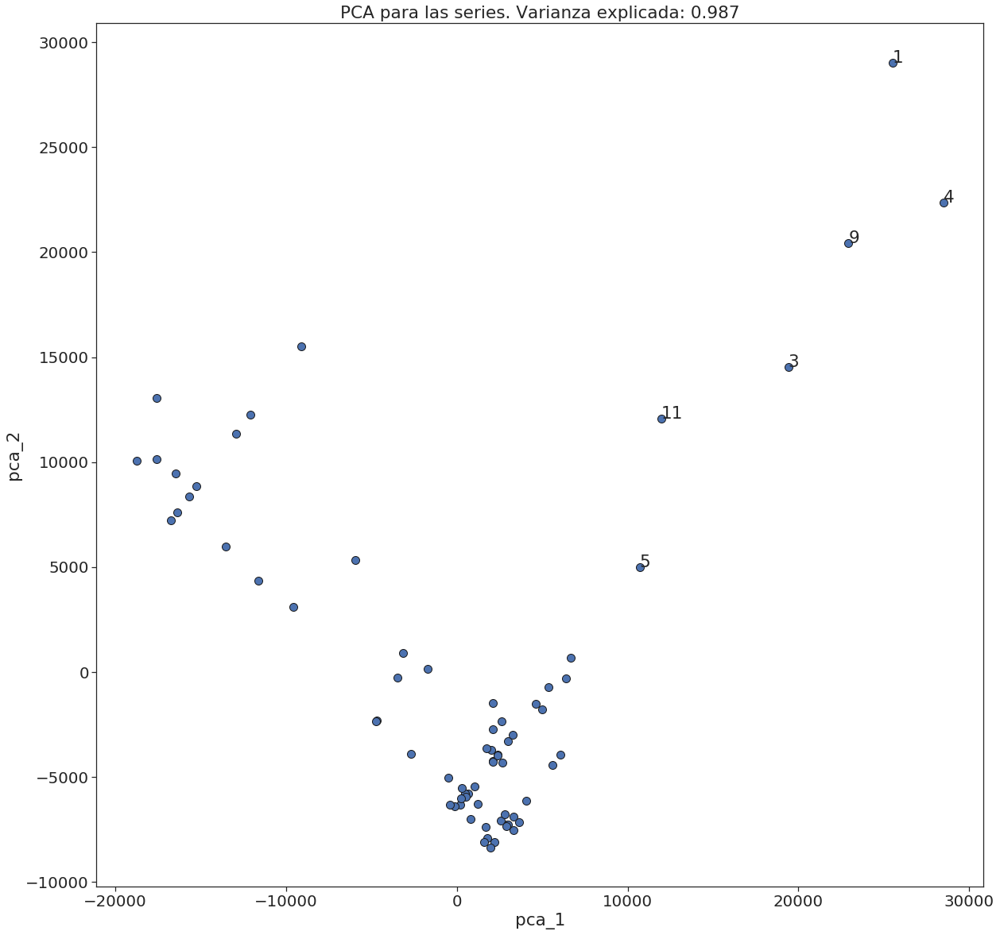

In [44]:
sns.set(style="ticks",font_scale = 1.8)
x, y = "pca_1", "pca_2"
plt.figure(figsize=(20,20))
plt.plot(pca_data[[x]], pca_data[[y]], 'o', 
                 markeredgecolor='k', markersize=10)
for txt in pca_data.index:
    
    ax, ay = pca_data.loc[txt,"pca_1"], pca_data.loc[txt,"pca_2"]
    if (ax> 10000):
        plt.text(x=ax, y=ay, s=txt)
plt.xlabel(x)
plt.ylabel(y)
# plt.text(120000, 38000, "pca explained variance: " + str(round(explained_variance.sum(),3)))
plt.title("PCA para las series. Varianza explicada: {}".format(round(explained_variance.sum(),3)))
plt.axis('equal')
plt.savefig("reports/clustering/space/pca_nozoom.png")

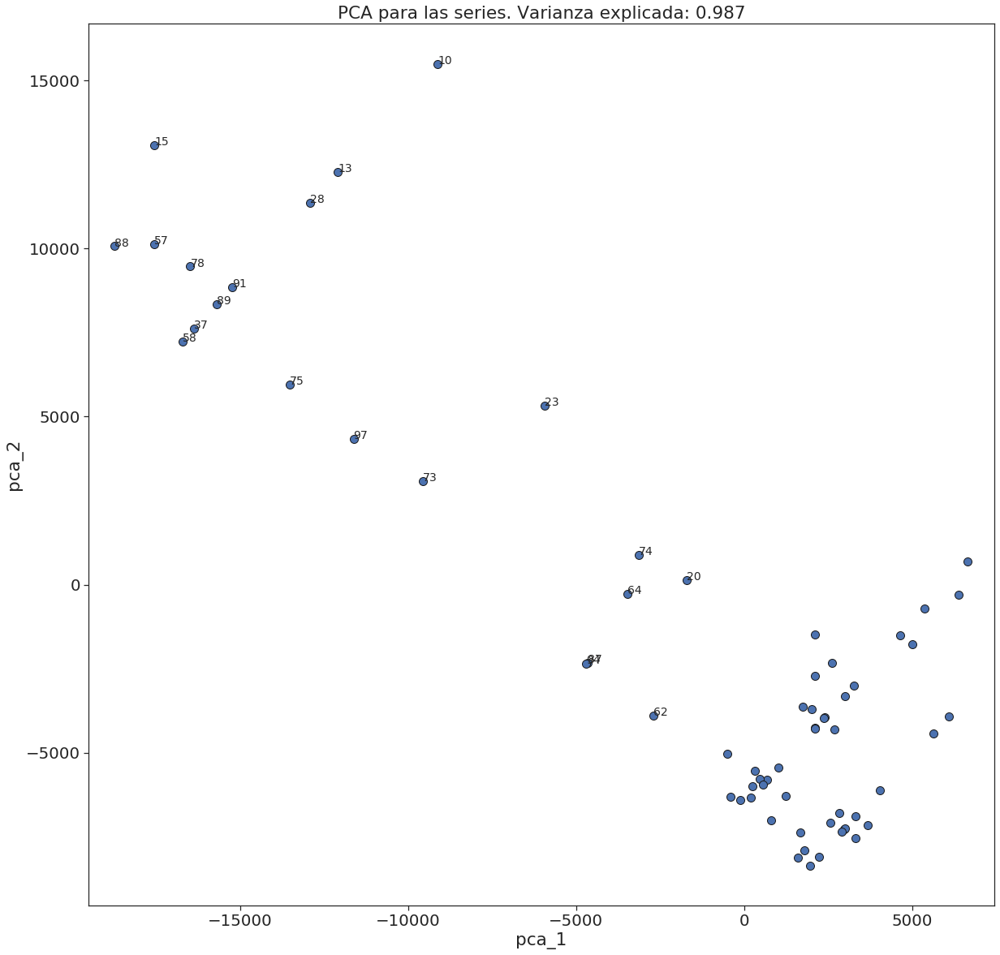

In [46]:
sns.set(style="ticks",font_scale = 1.8)
pca_data = pca_data.loc[(pca_data.pca_1 < 10000)]



font = {
        'size': 14,
        }


x, y = "pca_1", "pca_2"
plt.figure(figsize=(20,20))
plt.plot(pca_data[[x]], pca_data[[y]], 'o', 
                 markeredgecolor='k', markersize=10)
for txt in pca_data.index:
    
    ax, ay = pca_data.loc[txt,"pca_1"], pca_data.loc[txt,"pca_2"]
    if ax < -1000:
        plt.text(x=ax, y=ay, s=txt, fontdict =font)
plt.xlabel(x)
plt.ylabel(y)
plt.title("PCA para las series. Varianza explicada: {}".format(round(explained_variance.sum(),3)))
plt.axis('equal')
plt.savefig("reports/clustering/space/pca_zoom1.png")

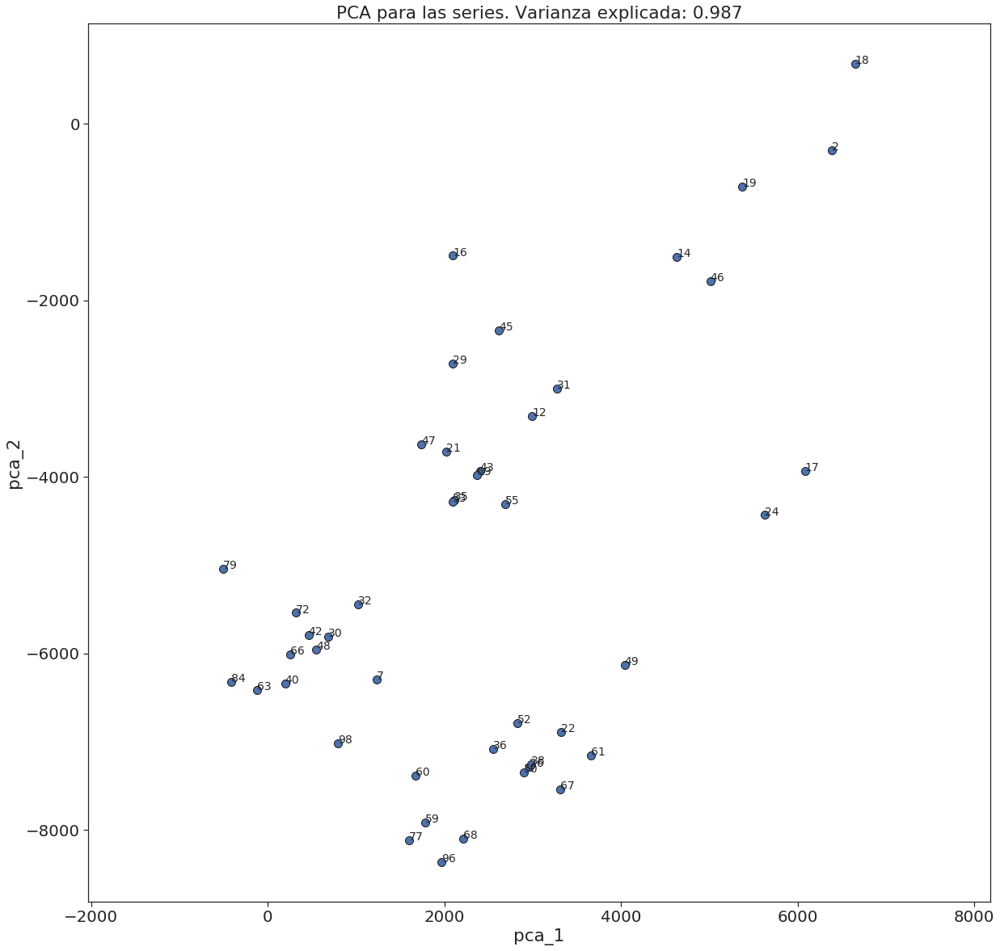

In [48]:
sns.set(style="ticks",font_scale = 1.8)
pca_data = pca_data.loc[(pca_data.pca_1 > -1000) ]



font = {
        'size': 14,
        }


x, y = "pca_1", "pca_2"
plt.figure(figsize=(20,20))
plt.plot(pca_data[[x]], pca_data[[y]], 'o', 
                 markeredgecolor='k', markersize=10)
for txt in pca_data.index:
    
    ax, ay = pca_data.loc[txt,"pca_1"], pca_data.loc[txt,"pca_2"]
    
    plt.text(x=ax, y=ay, s=txt, fontdict =font)
plt.xlabel(x)
plt.ylabel(y)
plt.title("PCA para las series. Varianza explicada: {}".format(round(explained_variance.sum(),3)))
plt.axis('equal')
plt.savefig("reports/clustering/space/pca_zoom2.png")

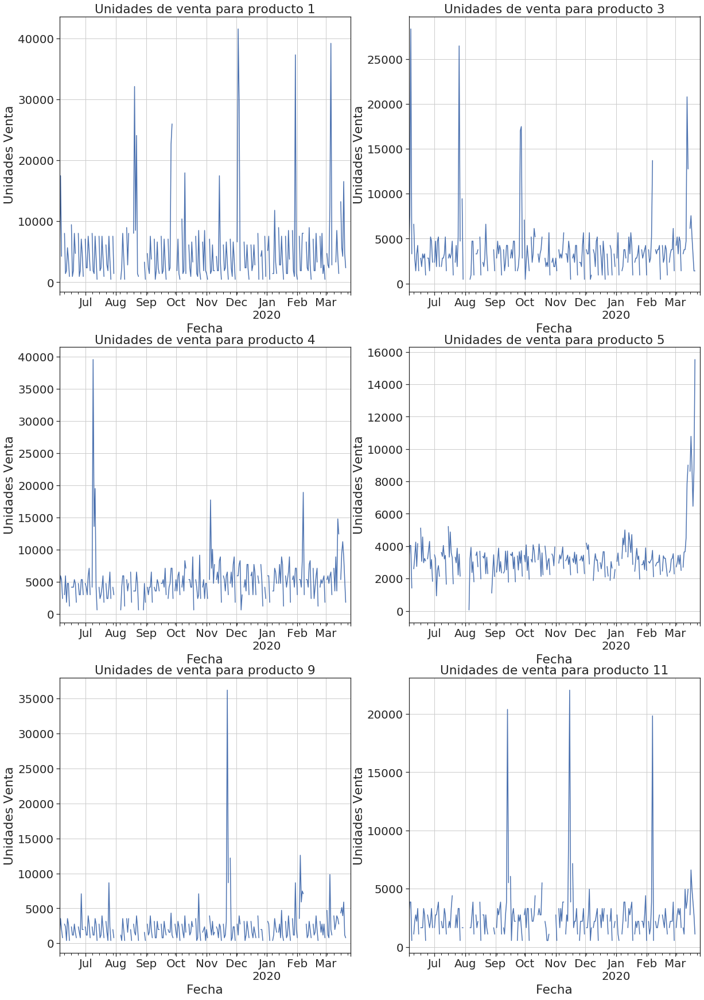

In [85]:
plt.figure(figsize=(20,30))

for i, prod in enumerate(['1', '3', '4', '5','9', '11']):
    plt.subplot(3,2,i+1)
    prod_data = main_df.loc[main_df.producto == prod].set_index("fecha")
    plot_series2(prod_data)
    plt.title("Unidades de venta para producto {}".format(prod))
    plt.grid(True)
plt.savefig("reports/clustering/space/grupo1.png")

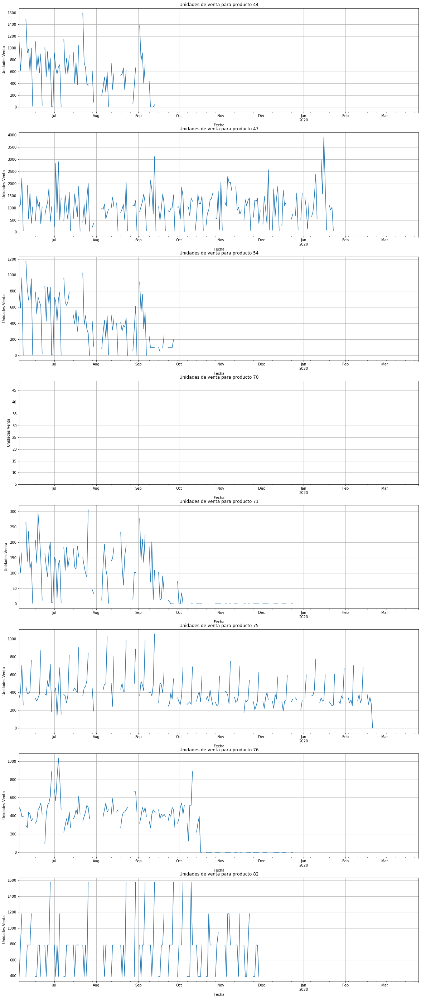

In [14]:
plt.figure(figsize=(20,50))

for i, prod in enumerate(['44', '47', '54', '70','71', '75','76','82']):
    plt.subplot(8,1,i+1)
    prod_data = main_df.loc[main_df.producto == prod].set_index("fecha")
    plot_series2(prod_data)
    plt.title("Unidades de venta para producto {}".format(prod))
    plt.grid(True)
#plt.savefig("reports/clustering/space/comparativa_series_cerca_lejos.png")

In [12]:
main_df.producto.unique()

array(['1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19',
       '2', '20', '21', '22', '23', '24', '26', '28', '29', '3', '30',
       '31', '32', '35', '36', '37', '38', '4', '40', '42', '43', '44',
       '45', '46', '47', '48', '49', '5', '50', '52', '53', '54', '55',
       '57', '58', '59', '60', '61', '62', '63', '64', '66', '67', '68',
       '69', '7', '70', '71', '72', '73', '74', '75', '76', '77', '78',
       '79', '80', '82', '84', '85', '87', '88', '89', '9', '91', '94',
       '95', '96', '97', '98', '99'], dtype=object)

## Que considera nuestro espacio cerca o lejos?

In [6]:
def plot_series(time, series, format="-", start=0, end=None):
    
    plt.plot(time[start:end], series[start:end], format)
    plt.xlabel("Fecha")
    plt.ylabel("Unidades Venta")

def plot_series2(df):
    df['udsventa'].plot()
    plt.xlabel("Fecha")
    plt.ylabel("Unidades Venta")
   

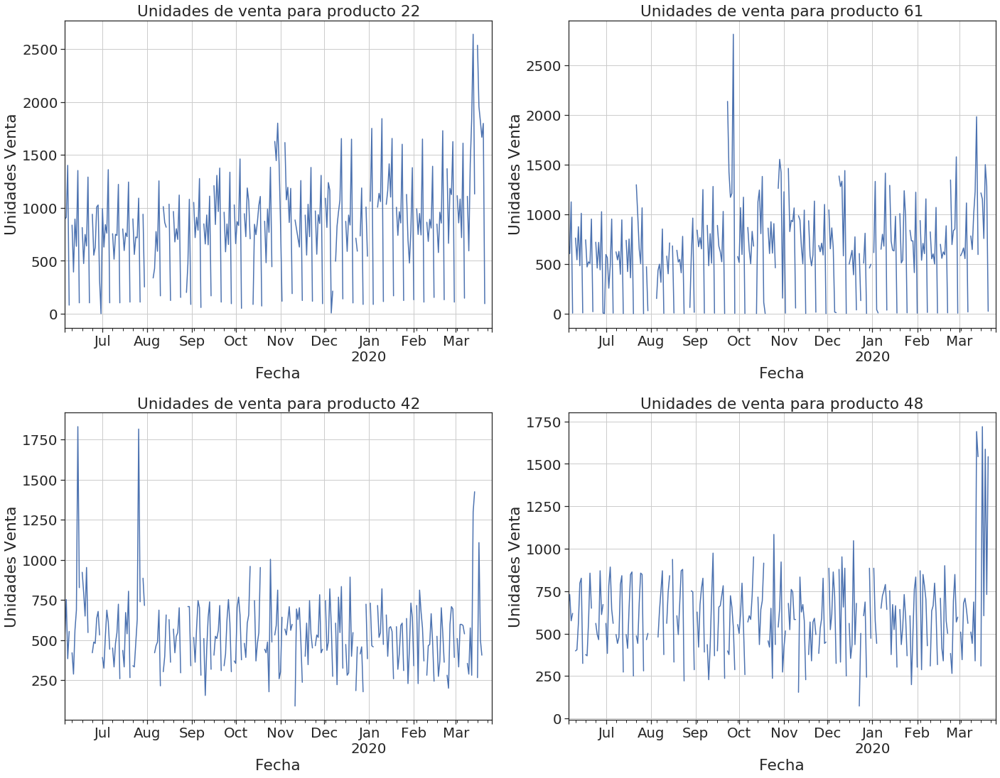

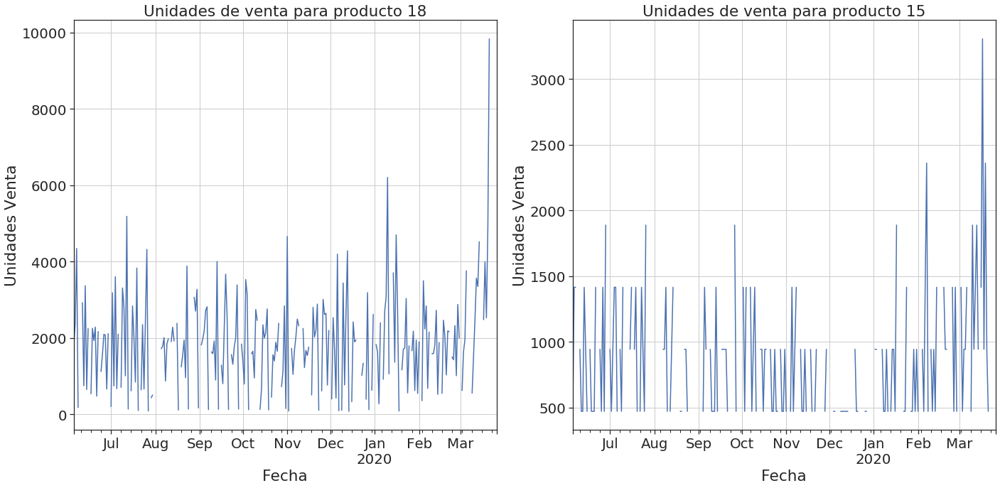

In [59]:
plt.figure(figsize=(20,30))

for i, prod in enumerate(['22', '61', '42', '48']):
    plt.subplot(4,2,i+1)
    prod_data = main_df.loc[main_df.producto == prod].set_index("fecha")
    plot_series2(prod_data)
    plt.title("Unidades de venta para producto {}".format(prod))
    plt.grid(True)
plt.tight_layout()
plt.savefig("reports/clustering/space/comparativa_series_cerca.png")


plt.figure(figsize=(20,10))

for i, prod in enumerate(['18','15']):
    plt.subplot(1,2,i+1)
    prod_data = main_df.loc[main_df.producto == prod].set_index("fecha")
    plot_series2(prod_data)
    plt.title("Unidades de venta para producto {}".format(prod))
    plt.grid(True)
plt.tight_layout()
plt.savefig("reports/clustering/space/comparativa_series_lejos.png")

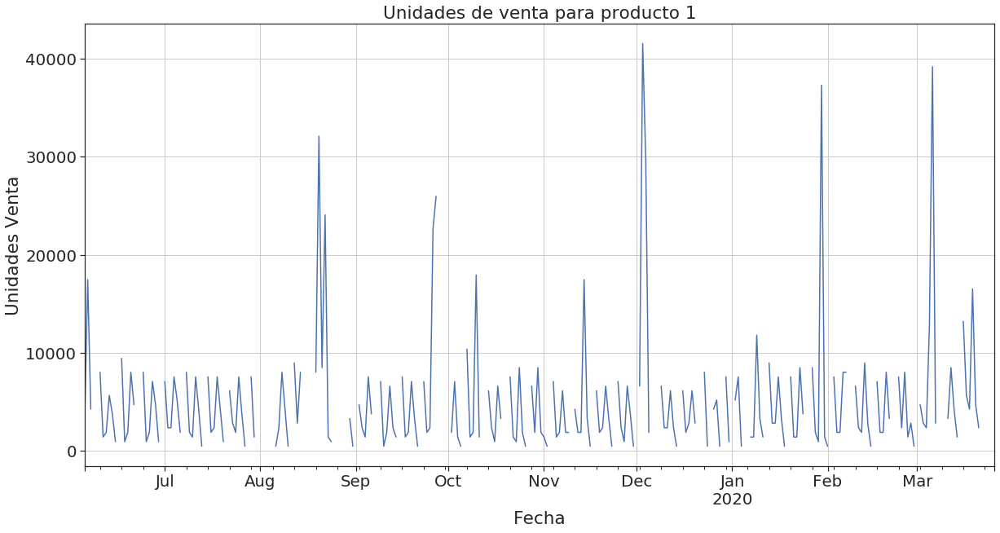

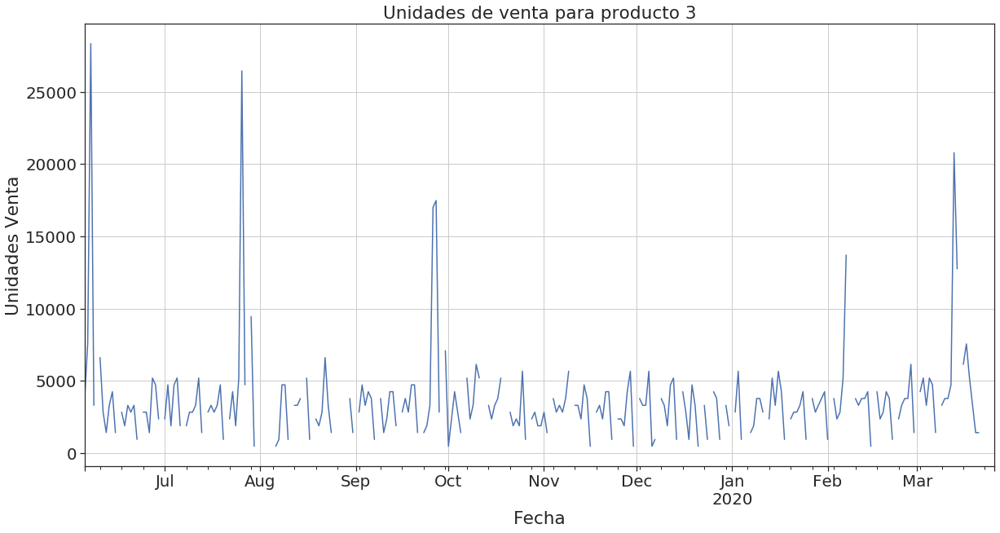

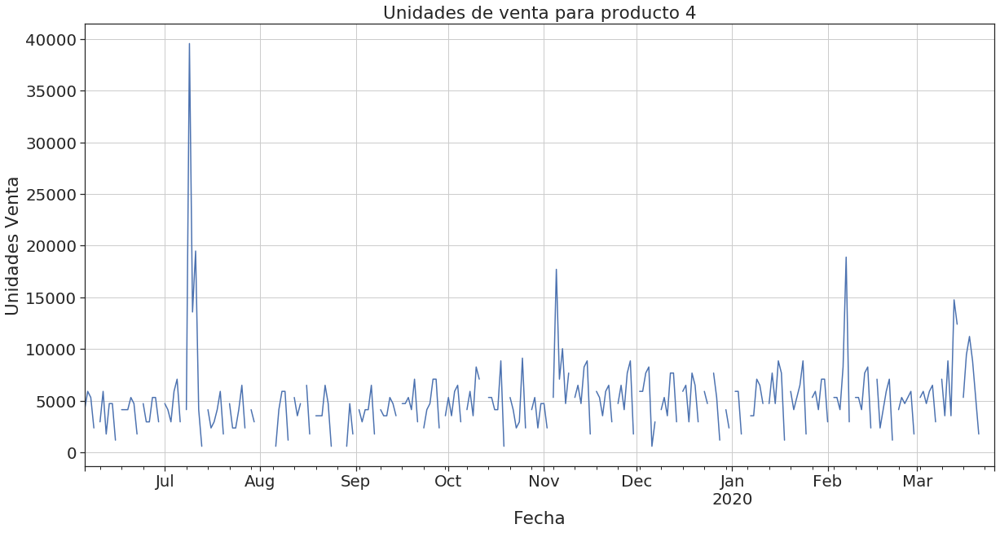

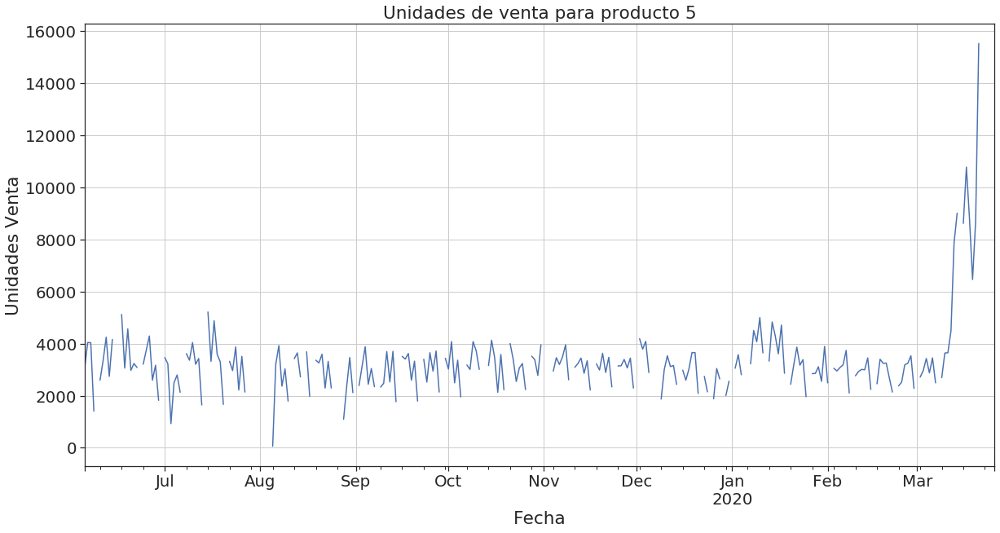

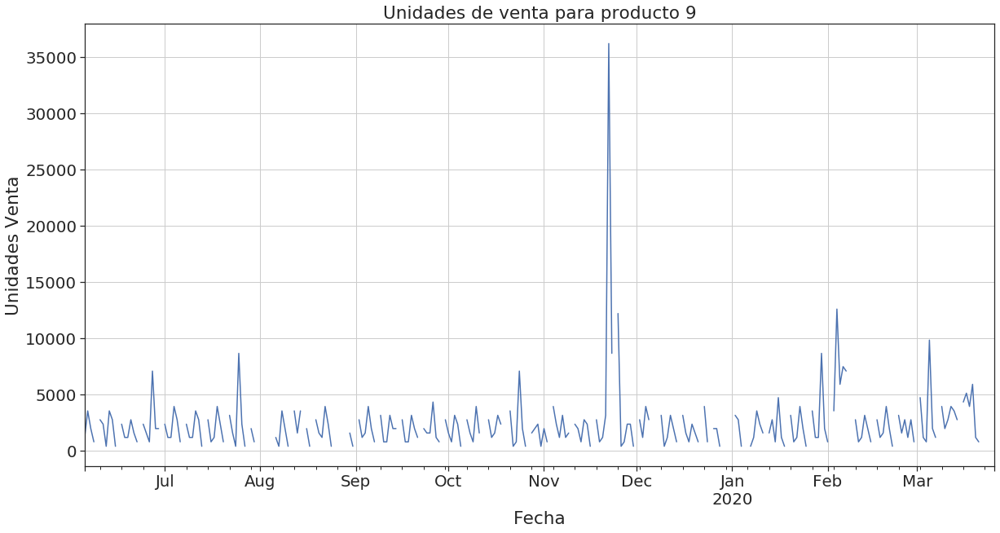

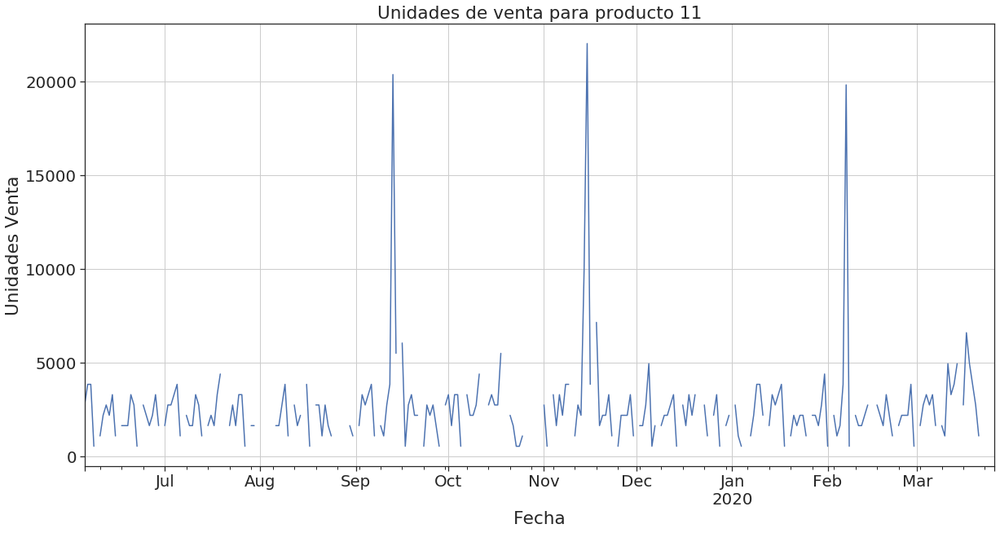

In [127]:

for i, prod in enumerate(['1', '3', '4', '5','9','11']):
    plt.figure(figsize=(20,10))
    prod_data = main_df.loc[main_df.producto == prod].set_index("fecha")
    plot_series2(prod_data)
    plt.title("Unidades de venta para producto {}".format(prod))
    plt.grid(True)
    plt.savefig("reports/clustering/space/extremos/serie_extrema1_{}.png".format(prod))

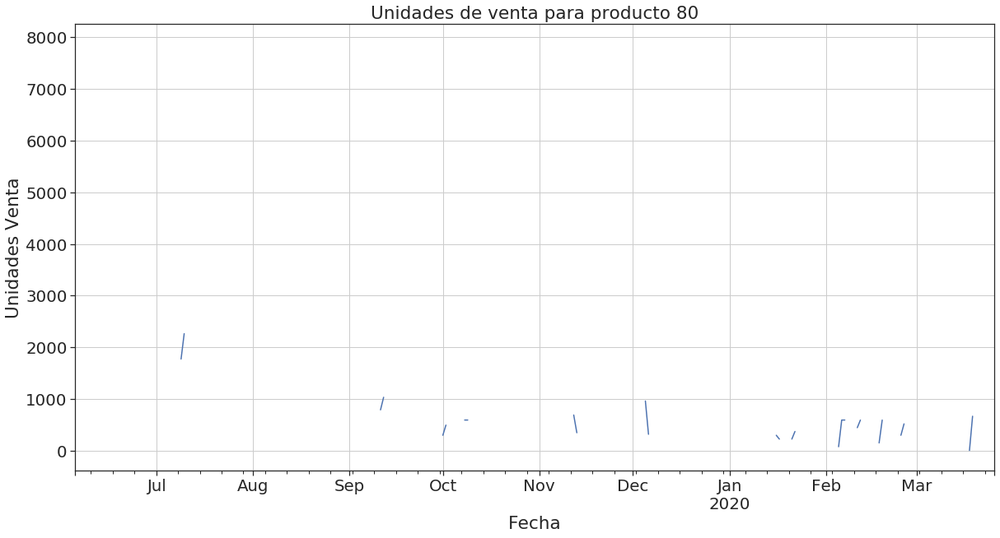

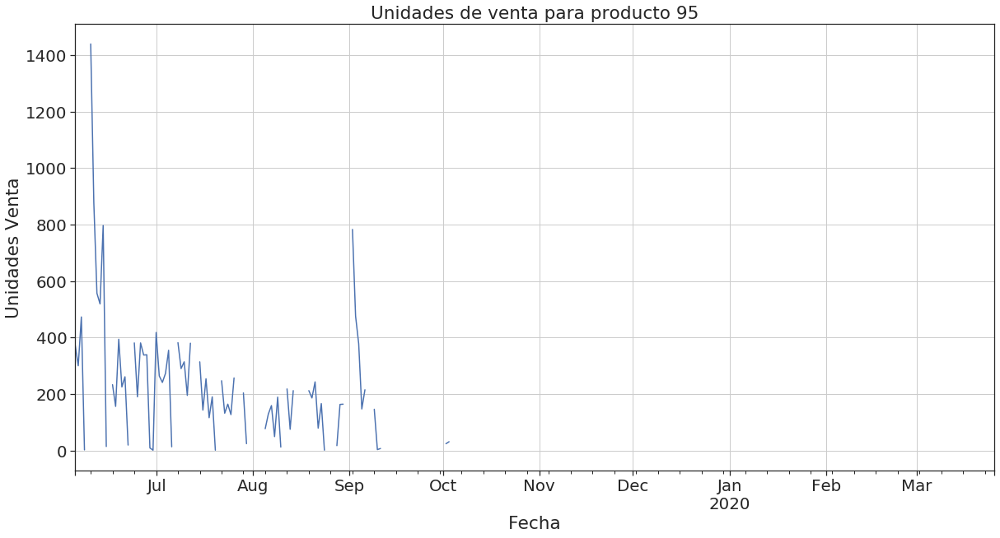

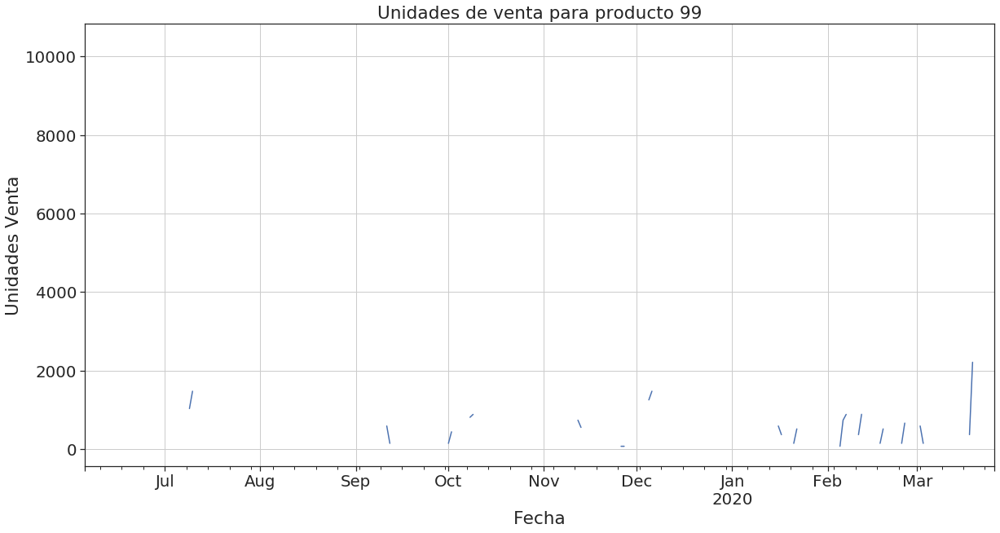

In [130]:
for i, prod in enumerate(['80', '95', '99']):
    plt.figure(figsize=(20,10))
    prod_data = main_df.loc[main_df.producto == prod].set_index("fecha")
    plot_series2(prod_data)
    plt.title("Unidades de venta para producto {}".format(prod))
    plt.grid(True)
    plt.savefig("reports/clustering/space/extremos/serie_extrema2_{}.png".format(prod))

In [70]:
data = df.drop(["fecha_min","fecha_max"], axis=1).set_index("producto")

In [71]:
data.head()

,frecuencia,intermitencia,venta_min,venta_q5,venta_q25,venta_median,venta_q75,venta_q95,venta_max,venta_iqr,...,venta_kurtosis,venta_mad,aug_ratio,wd_ratio_3,wd_ratio_4,wd_ratio_5,wd_ratio_6,wd_ratio_7,wd_ratio_1,wd_ratio_2
producto,,,,,,,,,,,,,,,,,,,,,
1,224,112358.744395,0.0,0.0,472.0,1889.0,6140.00,12232.80,41564.0,5668.00,...,15.050234,3784.991603,0.963964,0.767457,2.232604,1.190459,0.153996,0.0,1.810698,0.860774
10,195,128709.278351,0.0,0.0,0.0,1792.5,3032.50,5186.75,9490.0,3032.50,...,0.586530,1398.386400,0.701511,1.175611,2.090088,1.885536,0.000000,0.0,0.921395,0.923680
11,227,110867.256637,0.0,0.0,551.0,1653.0,2755.00,4408.00,22041.0,2204.00,...,34.470112,1393.291518,0.578454,0.994103,1.363705,2.090199,0.560776,0.0,0.985710,1.005293
12,235,107076.923077,0.0,0.0,469.5,870.0,1283.75,1833.05,5057.0,814.25,...,6.426522,504.840683,0.689417,1.149821,1.506559,1.558032,0.887718,0.0,0.962776,0.932603
13,195,128709.278351,0.0,0.0,0.0,1549.0,2442.50,3856.00,5421.0,2442.50,...,-0.589084,1091.281174,0.762283,1.125007,2.087554,1.850072,0.000000,0.0,0.973420,0.962418


In [63]:
"ana" + str(-1)

'ana-1'

In [64]:
products= clusters[]
# CREATE CLUSTER MODELS
for cluster in ["0"]:#list(clusters):
    key = "CL_" + cluster
    base["productos"] = clusters[cluster]
    base["tags"]["type"] = "cluster"
    config[key] = base

#CREATE MONOPRODUCT MODELS
for product in ["87"]: #data.producto.unique():
    key = "PR_" + product
    base["productos"] = [product]
    base["tags"]["type"] = "monoproducto"
    config[key] = base


with open("config/model_stock.json", "w") as config_file: 
    json.dump(config, config_file)

SyntaxError: invalid syntax (<ipython-input-64-7ce4a187535f>, line 1)

In [65]:
# Get the number of PCA compontents for 0.9999 explanation
n = get_pca_components(data, variance_limit=0.9999)
n

4

/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Metrics:
{'n_features': 2, 'epsilon': 0.1, 'min_samples': 2, 'n_clusters': 10, 'n_noise': 27, 'silhouette': 0.14088749150436458, 'silouette_nonoise': 0.600109482194588, 'silouette_originaldata': 0.1119275374036583, 'explained_pca_variance': 0.995670993943123}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when 

Metrics:
{'n_features': 2, 'epsilon': 0.1, 'min_samples': 3, 'n_clusters': 4, 'n_noise': 39, 'silhouette': 0.15372171248925273, 'silouette_nonoise': 0.6500574294342304, 'silouette_originaldata': 0.1406249196724003, 'explained_pca_variance': 0.9967497197649718}
Metrics:
{'n_features': 2, 'epsilon': 0.1, 'min_samples': 4, 'n_clusters': 4, 'n_noise': 40, 'silhouette': 0.1365287352507626, 'silouette_nonoise': 0.6561153566258453, 'silouette_originaldata': 0.12461082210881459, 'explained_pca_variance': 0.9973980932468252}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when 

Metrics:
{'n_features': 2, 'epsilon': 0.1, 'min_samples': 5, 'n_clusters': 4, 'n_noise': 41, 'silhouette': 0.1231499590795348, 'silouette_nonoise': 0.676770434163236, 'silouette_originaldata': 0.11109431759483639, 'explained_pca_variance': 0.9978308036582705}
Metrics:
{'n_features': 2, 'epsilon': 0.2, 'min_samples': 2, 'n_clusters': 7, 'n_noise': 13, 'silhouette': 0.2847968580398047, 'silouette_nonoise': 0.46194430688339444, 'silouette_originaldata': 0.2922604641510968, 'explained_pca_variance': 0.9981401124583943}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Metrics:
{'n_features': 2, 'epsilon': 0.2, 'min_samples': 3, 'n_clusters': 4, 'n_noise': 19, 'silhouette': 0.3004363491190723, 'silouette_nonoise': 0.6028287933427381, 'silouette_originaldata': 0.29630218981388606, 'explained_pca_variance': 0.998372218561095}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Metrics:
{'n_features': 2, 'epsilon': 0.2, 'min_samples': 4, 'n_clusters': 3, 'n_noise': 24, 'silhouette': 0.2050008540649351, 'silouette_nonoise': 0.5689284141151315, 'silouette_originaldata': 0.20536289584103445, 'explained_pca_variance': 0.9985528227901396}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Metrics:
{'n_features': 2, 'epsilon': 0.2, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 29, 'silhouette': 0.3171664604521951, 'silouette_nonoise': 0.8871984823795072, 'silouette_originaldata': 0.31410993861544334, 'explained_pca_variance': 0.9986973522378435}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when 

Metrics:
{'n_features': 2, 'epsilon': 0.30000000000000004, 'min_samples': 2, 'n_clusters': 4, 'n_noise': 9, 'silhouette': 0.5793603366009147, 'silouette_nonoise': 0.6854235307214159, 'silouette_originaldata': 0.5809240407048645, 'explained_pca_variance': 0.9988156347088548}
Metrics:
{'n_features': 2, 'epsilon': 0.30000000000000004, 'min_samples': 3, 'n_clusters': 3, 'n_noise': 11, 'silhouette': 0.5462563274924326, 'silouette_nonoise': 0.693195178214769, 'silouette_originaldata': 0.5465525515103179, 'explained_pca_variance': 0.998914224696687}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when 

Metrics:
{'n_features': 2, 'epsilon': 0.30000000000000004, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 14, 'silhouette': 0.5859151851916852, 'silouette_nonoise': 0.8129712710204358, 'silouette_originaldata': 0.5831968035674487, 'explained_pca_variance': 0.9989976622137933}
Metrics:
{'n_features': 2, 'epsilon': 0.30000000000000004, 'min_samples': 5, 'n_clusters': 3, 'n_noise': 14, 'silhouette': 0.3900555897707781, 'silouette_nonoise': 0.5770289947338628, 'silouette_originaldata': 0.3917245616326455, 'explained_pca_variance': 0.9990691911257792}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when 

Metrics:
{'n_features': 2, 'epsilon': 0.4, 'min_samples': 2, 'n_clusters': 2, 'n_noise': 8, 'silhouette': 0.6960647798027078, 'silouette_nonoise': 0.778666129419223, 'silouette_originaldata': 0.6959300031780155, 'explained_pca_variance': 0.9991311910164499}
Metrics:
{'n_features': 2, 'epsilon': 0.4, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 8, 'silhouette': 0.6960647799428954, 'silouette_nonoise': 0.7786661295715125, 'silouette_originaldata': 0.6959739986948537, 'explained_pca_variance': 0.9991854475534385}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when 

Metrics:
{'n_features': 2, 'epsilon': 0.4, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 10, 'silhouette': 0.6626461550818287, 'silouette_nonoise': 0.7951524011416491, 'silouette_originaldata': 0.661501336291267, 'explained_pca_variance': 0.9992333256610719}
Metrics:
{'n_features': 2, 'epsilon': 0.4, 'min_samples': 5, 'n_clusters': 3, 'n_noise': 10, 'silhouette': 0.4169054041448511, 'silouette_nonoise': 0.5138625217781776, 'silouette_originaldata': 0.4168725119675588, 'explained_pca_variance': 0.9992758878006168}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Metrics:
{'n_features': 2, 'epsilon': 0.5, 'min_samples': 2, 'n_clusters': 2, 'n_noise': 7, 'silhouette': 0.7050890889384132, 'silouette_nonoise': 0.7615840396542893, 'silouette_originaldata': 0.7048528868858973, 'explained_pca_variance': 0.9993139727693676}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when 

Metrics:
{'n_features': 2, 'epsilon': 0.5, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 7, 'silhouette': 0.7050890890356771, 'silouette_nonoise': 0.7615840397618376, 'silouette_originaldata': 0.7048834231657528, 'explained_pca_variance': 0.9993482518789992}
Metrics:
{'n_features': 2, 'epsilon': 0.5, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 9, 'silhouette': 0.684592231314358, 'silouette_nonoise': 0.793048087587871, 'silouette_originaldata': 0.6835366440240885, 'explained_pca_variance': 0.9993792682337317}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when 

Metrics:
{'n_features': 2, 'epsilon': 0.5, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 9, 'silhouette': 0.6845922313885713, 'silouette_nonoise': 0.7930480876664349, 'silouette_originaldata': 0.6835598845614812, 'explained_pca_variance': 0.9994074665684919}
Metrics:
{'n_features': 2, 'epsilon': 0.6, 'min_samples': 2, 'n_clusters': 2, 'n_noise': 6, 'silhouette': 0.7273283753129506, 'silouette_nonoise': 0.7572466890512266, 'silouette_originaldata': 0.7278526469282978, 'explained_pca_variance': 0.999433214288957}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 2, 'epsilon': 0.6, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 6, 'silhouette': 0.7273283754018256, 'silouette_nonoise': 0.7572466891347095, 'silouette_originaldata': 0.7278755638614928, 'explained_pca_variance': 0.9994568175648153}
Metrics:
{'n_features': 2, 'epsilon': 0.6, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 6, 'silhouette': 0.7273283754647573, 'silouette_nonoise': 0.7572466892068608, 'silouette_originaldata': 0.7278967381087826, 'explained_pca_variance': 0.9994785335380243}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 2, 'epsilon': 0.6, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 7, 'silhouette': 0.7152861291955543, 'silouette_nonoise': 0.7732844622622405, 'silouette_originaldata': 0.7157156019686318, 'explained_pca_variance': 0.9994985798805665}
Metrics:
{'n_features': 2, 'epsilon': 0.7000000000000001, 'min_samples': 2, 'n_clusters': 2, 'n_noise': 3, 'silhouette': 0.6091547020338208, 'silouette_nonoise': 0.7162171297380303, 'silouette_originaldata': 0.6078010472172536, 'explained_pca_variance': 0.9995171420174508}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when 


[ERROR] Problem training model with pca_components: 2, eps 0.7000000000000001 and min samples 3


[ERROR] Problem training model with pca_components: 2, eps 0.7000000000000001 and min samples 4

Metrics:
{'n_features': 2, 'epsilon': 0.7000000000000001, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 5, 'silhouette': 0.7252057497623903, 'silouette_nonoise': 0.7420109076178268, 'silouette_originaldata': 0.727387309935643, 'explained_pca_variance': 0.9995654068488292}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 2, 'epsilon': 0.8, 'min_samples': 2, 'n_clusters': 2, 'n_noise': 3, 'silhouette': 0.6091547021385016, 'silouette_nonoise': 0.7162171298194835, 'silouette_originaldata': 0.60783716671836, 'explained_pca_variance': 0.9995794200807004}

[ERROR] Problem training model with pca_components: 2, eps 0.8 and min samples 3


[ERROR] Problem training model with pca_components: 2, eps 0.8 and min samples 4



/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when 


[ERROR] Problem training model with pca_components: 2, eps 0.8 and min samples 5


[ERROR] Problem training model with pca_components: 2, eps 0.9 and min samples 2


[ERROR] Problem training model with pca_components: 2, eps 0.9 and min samples 3


[ERROR] Problem training model with pca_components: 2, eps 0.9 and min samples 4


[ERROR] Problem training model with pca_components: 2, eps 0.9 and min samples 5


[ERROR] Problem training model with pca_components: 2, eps 1.0 and min samples 2


[ERROR] Problem training model with pca_components: 2, eps 1.0 and min samples 3


[ERROR] Problem training model with pca_components: 2, eps 1.0 and min samples 4


[ERROR] Problem training model with pca_components: 2, eps 1.0 and min samples 5

Metrics:
{'n_features': 3, 'epsilon': 0.1, 'min_samples': 2, 'n_clusters': 6, 'n_noise': 51, 'silhouette': -0.18290743334079423, 'silouette_nonoise': 0.5152791349468464, 'silouette_originaldata': -0.3298233973758979, 'explained_pca_variance': 0.99994286

/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 3, 'epsilon': 0.1, 'min_samples': 3, 'n_clusters': 3, 'n_noise': 57, 'silhouette': -0.15022479974892075, 'silouette_nonoise': 0.6896069116791003, 'silouette_originaldata': -0.18003680459968718, 'explained_pca_variance': 0.999944175849254}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 3, 'epsilon': 0.1, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 60, 'silhouette': -0.20194099260904602, 'silouette_nonoise': 0.7968639232670561, 'silouette_originaldata': -0.22458312344101106, 'explained_pca_variance': 0.9999454288320901}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 3, 'epsilon': 0.1, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 62, 'silhouette': -0.24461940262713877, 'silouette_nonoise': 0.7958138525985967, 'silouette_originaldata': -0.2718848899273789, 'explained_pca_variance': 0.9999466265907567}
Metrics:
{'n_features': 3, 'epsilon': 0.2, 'min_samples': 2, 'n_clusters': 6, 'n_noise': 30, 'silhouette': 0.051154897407590605, 'silouette_nonoise': 0.1615032184071578, 'silouette_originaldata': -0.14849854186614156, 'explained_pca_variance': 0.999947772877929}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 3, 'epsilon': 0.2, 'min_samples': 3, 'n_clusters': 4, 'n_noise': 34, 'silhouette': 0.01553897342756336, 'silouette_nonoise': 0.24783970257034754, 'silouette_originaldata': -0.09626924265895855, 'explained_pca_variance': 0.9999488706063837}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 3, 'epsilon': 0.2, 'min_samples': 4, 'n_clusters': 3, 'n_noise': 38, 'silhouette': -0.030294701236988925, 'silouette_nonoise': 0.37325111188712096, 'silouette_originaldata': -0.09988391672795362, 'explained_pca_variance': 0.9999499236554004}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 3, 'epsilon': 0.2, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 49, 'silhouette': -0.021934864055523435, 'silouette_nonoise': 0.3769593251529483, 'silouette_originaldata': -0.08981388391816915, 'explained_pca_variance': 0.9999509340927779}
Metrics:
{'n_features': 3, 'epsilon': 0.30000000000000004, 'min_samples': 2, 'n_clusters': 6, 'n_noise': 22, 'silhouette': 0.11421933244821875, 'silouette_nonoise': 0.4048610275879345, 'silouette_originaldata': 0.09881753589366868, 'explained_pca_variance': 0.999951904550565}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 3, 'epsilon': 0.30000000000000004, 'min_samples': 3, 'n_clusters': 5, 'n_noise': 24, 'silhouette': 0.1309485878360908, 'silouette_nonoise': 0.39331442685096646, 'silouette_originaldata': 0.10735142733383962, 'explained_pca_variance': 0.9999528370943516}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 3, 'epsilon': 0.30000000000000004, 'min_samples': 4, 'n_clusters': 3, 'n_noise': 31, 'silhouette': 0.08603702968040221, 'silouette_nonoise': 0.41279452673350864, 'silouette_originaldata': 0.040101564620506874, 'explained_pca_variance': 0.9999537344761351}
Metrics:
{'n_features': 3, 'epsilon': 0.30000000000000004, 'min_samples': 5, 'n_clusters': 3, 'n_noise': 31, 'silhouette': 0.08603703236514931, 'silouette_nonoise': 0.4128096951777736, 'silouette_originaldata': 0.04016821390874333, 'explained_pca_variance': 0.9999545982882816}


/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub

Metrics:
{'n_features': 3, 'epsilon': 0.4, 'min_samples': 2, 'n_clusters': 4, 'n_noise': 17, 'silhouette': 0.35094266278066577, 'silouette_nonoise': 0.3967592816055483, 'silouette_originaldata': 0.19252042573209227, 'explained_pca_variance': 0.9999554303930097}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 3, 'epsilon': 0.4, 'min_samples': 3, 'n_clusters': 4, 'n_noise': 17, 'silhouette': 0.35094265980438727, 'silouette_nonoise': 0.3974630258406786, 'silouette_originaldata': 0.19307948962454682, 'explained_pca_variance': 0.9999562325178097}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 3, 'epsilon': 0.4, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 25, 'silhouette': 0.4028343858801739, 'silouette_nonoise': 0.8515566327139256, 'silouette_originaldata': 0.3753821479965105, 'explained_pca_variance': 0.9999570063036003}
Metrics:
{'n_features': 3, 'epsilon': 0.4, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 25, 'silhouette': 0.4028343861652068, 'silouette_nonoise': 0.8515198932181836, 'silouette_originaldata': 0.3754185770239485, 'explained_pca_variance': 0.9999577532969018}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 3, 'epsilon': 0.5, 'min_samples': 2, 'n_clusters': 4, 'n_noise': 15, 'silhouette': 0.37310615871230957, 'silouette_nonoise': 0.36425724903155887, 'silouette_originaldata': 0.19561023167895816, 'explained_pca_variance': 0.9999584746918819}
Metrics:
{'n_features': 3, 'epsilon': 0.5, 'min_samples': 3, 'n_clusters': 4, 'n_noise': 15, 'silhouette': 0.3731061561512954, 'silouette_nonoise': 0.3649462069264077, 'silouette_originaldata': 0.1961537423649168, 'explained_pca_variance': 0.9999591717924696}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 3, 'epsilon': 0.5, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 22, 'silhouette': 0.4480789561964518, 'silouette_nonoise': 0.8262310024152139, 'silouette_originaldata': 0.42096476500463337, 'explained_pca_variance': 0.9999598459380306}
Metrics:
{'n_features': 3, 'epsilon': 0.5, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 23, 'silhouette': 0.4369232814590455, 'silouette_nonoise': 0.8385586749716499, 'silouette_originaldata': 0.4118279919506903, 'explained_pca_variance': 0.999960498271527}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 3, 'epsilon': 0.6, 'min_samples': 2, 'n_clusters': 3, 'n_noise': 11, 'silhouette': 0.5233369762536413, 'silouette_nonoise': 0.7077246620448064, 'silouette_originaldata': 0.5531965883250349, 'explained_pca_variance': 0.9999611296638329}
Metrics:
{'n_features': 3, 'epsilon': 0.6, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 13, 'silhouette': 0.5045534355333781, 'silouette_nonoise': 0.7923415211103907, 'silouette_originaldata': 0.584963079427815, 'explained_pca_variance': 0.9999617411899221}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 3, 'epsilon': 0.6, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 16, 'silhouette': 0.4849263833593223, 'silouette_nonoise': 0.7956343517930465, 'silouette_originaldata': 0.5172697920466214, 'explained_pca_variance': 0.9999623337946757}
Metrics:
{'n_features': 3, 'epsilon': 0.6, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 19, 'silhouette': 0.47945925924891886, 'silouette_nonoise': 0.8075182463508787, 'silouette_originaldata': 0.47204654923298683, 'explained_pca_variance': 0.9999629082978654}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 3, 'epsilon': 0.7000000000000001, 'min_samples': 2, 'n_clusters': 3, 'n_noise': 7, 'silhouette': 0.5529112890676553, 'silouette_nonoise': 0.6902457729697871, 'silouette_originaldata': 0.6288143908412525, 'explained_pca_variance': 0.9999634655444681}
Metrics:
{'n_features': 3, 'epsilon': 0.7000000000000001, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 9, 'silhouette': 0.5374652371814823, 'silouette_nonoise': 0.7691102030788228, 'silouette_originaldata': 0.6525198256413229, 'explained_pca_variance': 0.999964006305053}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 3, 'epsilon': 0.7000000000000001, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 9, 'silhouette': 0.5374652372461965, 'silouette_nonoise': 0.7690495571701645, 'silouette_originaldata': 0.6524736275163581, 'explained_pca_variance': 0.9999645312842326}
Metrics:
{'n_features': 3, 'epsilon': 0.7000000000000001, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 10, 'silhouette': 0.5348265488018994, 'silouette_nonoise': 0.7803147097097947, 'silouette_originaldata': 0.651821357197301, 'explained_pca_variance': 0.9999650411656098}


/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub

Metrics:
{'n_features': 3, 'epsilon': 0.8, 'min_samples': 2, 'n_clusters': 2, 'n_noise': 7, 'silhouette': 0.4807888170904062, 'silouette_nonoise': 0.42758699193698685, 'silouette_originaldata': 0.39422729442665744, 'explained_pca_variance': 0.9999655365958422}

[ERROR] Problem training model with pca_components: 3, eps 0.8 and min samples 3



/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figu


[ERROR] Problem training model with pca_components: 3, eps 0.8 and min samples 4

Metrics:
{'n_features': 3, 'epsilon': 0.8, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 9, 'silhouette': 0.5314167688329218, 'silouette_nonoise': 0.7584185565320137, 'silouette_originaldata': 0.6426366140554626, 'explained_pca_variance': 0.9999669420817167}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 3, 'epsilon': 0.9, 'min_samples': 2, 'n_clusters': 2, 'n_noise': 5, 'silhouette': 0.49182870639131415, 'silouette_nonoise': 0.41806004450830403, 'silouette_originaldata': 0.42745414530030007, 'explained_pca_variance': 0.9999673854326553}

[ERROR] Problem training model with pca_components: 3, eps 0.9 and min samples 3



/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when 


[ERROR] Problem training model with pca_components: 3, eps 0.9 and min samples 4


[ERROR] Problem training model with pca_components: 3, eps 0.9 and min samples 5

Metrics:
{'n_features': 3, 'epsilon': 1.0, 'min_samples': 2, 'n_clusters': 3, 'n_noise': 3, 'silhouette': 0.4205040594331343, 'silouette_nonoise': 0.4018872927333509, 'silouette_originaldata': 0.3968332191604579, 'explained_pca_variance': 0.9999690460098624}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when 


[ERROR] Problem training model with pca_components: 3, eps 1.0 and min samples 3


[ERROR] Problem training model with pca_components: 3, eps 1.0 and min samples 4


[ERROR] Problem training model with pca_components: 3, eps 1.0 and min samples 5

Metrics:
{'n_features': 4, 'epsilon': 0.1, 'min_samples': 2, 'n_clusters': 5, 'n_noise': 59, 'silhouette': -0.31427810081257823, 'silouette_nonoise': 0.6551194017833921, 'silouette_originaldata': -0.40129790241053687, 'explained_pca_variance': 0.9999936697458303}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 4, 'epsilon': 0.1, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 65, 'silhouette': -0.29938027172368503, 'silouette_nonoise': 0.8255932759655517, 'silouette_originaldata': -0.33892022321945176, 'explained_pca_variance': 0.9999937455267396}

[ERROR] Problem training model with pca_components: 4, eps 0.1 and min samples 4


[ERROR] Problem training model with pca_components: 4, eps 0.1 and min samples 5

Metrics:
{'n_features': 4, 'epsilon': 0.2, 'min_samples': 2, 'n_clusters': 7, 'n_noise': 45, 'silhouette': -0.1336090840450056, 'silouette_nonoise': 0.6192643510999112, 'silouette_originaldata': -0.18701170038603476, 'explained_pca_variance': 0.9999939627950466}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 4, 'epsilon': 0.2, 'min_samples': 3, 'n_clusters': 4, 'n_noise': 51, 'silhouette': -0.1761071269192798, 'silouette_nonoise': 0.6544445326483596, 'silouette_originaldata': -0.2162492060048222, 'explained_pca_variance': 0.999994031593593}
Metrics:
{'n_features': 4, 'epsilon': 0.2, 'min_samples': 4, 'n_clusters': 3, 'n_noise': 58, 'silhouette': -0.17707022471677492, 'silouette_nonoise': 0.5939108751259042, 'silouette_originaldata': -0.21785841329050326, 'explained_pca_variance': 0.9999940992695743}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 4, 'epsilon': 0.2, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 62, 'silhouette': -0.22267861862420416, 'silouette_nonoise': 0.6281074421829922, 'silouette_originaldata': -0.2781066450351889, 'explained_pca_variance': 0.9999941653202152}
Metrics:
{'n_features': 4, 'epsilon': 0.30000000000000004, 'min_samples': 2, 'n_clusters': 5, 'n_noise': 36, 'silhouette': 0.007559617217508912, 'silouette_nonoise': 0.42893000303202483, 'silouette_originaldata': -0.061873486159056273, 'explained_pca_variance': 0.9999942298912557}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 4, 'epsilon': 0.30000000000000004, 'min_samples': 3, 'n_clusters': 3, 'n_noise': 40, 'silhouette': -0.030134426421689915, 'silouette_nonoise': 0.41402387906823, 'silouette_originaldata': -0.0953456768483409, 'explained_pca_variance': 0.9999942929369088}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 4, 'epsilon': 0.30000000000000004, 'min_samples': 4, 'n_clusters': 3, 'n_noise': 40, 'silhouette': -0.030134424186975428, 'silouette_nonoise': 0.4140644023734669, 'silouette_originaldata': -0.09530128642721393, 'explained_pca_variance': 0.9999943547216833}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 4, 'epsilon': 0.30000000000000004, 'min_samples': 5, 'n_clusters': 3, 'n_noise': 41, 'silhouette': -0.03403005209627449, 'silouette_nonoise': 0.43813760406844837, 'silouette_originaldata': -0.09669350536916595, 'explained_pca_variance': 0.9999944151599055}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 4, 'epsilon': 0.4, 'min_samples': 2, 'n_clusters': 6, 'n_noise': 27, 'silhouette': 0.02156714635560979, 'silouette_nonoise': 0.4181337641657847, 'silouette_originaldata': 0.018234781373971526, 'explained_pca_variance': 0.9999944743198543}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 4, 'epsilon': 0.4, 'min_samples': 3, 'n_clusters': 3, 'n_noise': 33, 'silhouette': 0.05458434212268881, 'silouette_nonoise': 0.6565847477373351, 'silouette_originaldata': 0.12923566273812387, 'explained_pca_variance': 0.9999945321374846}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 4, 'epsilon': 0.4, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 38, 'silhouette': 0.16377965147656567, 'silouette_nonoise': 0.8953570629943706, 'silouette_originaldata': 0.14353750412756103, 'explained_pca_variance': 0.9999945889829739}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 4, 'epsilon': 0.4, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 38, 'silhouette': 0.16377965237409914, 'silouette_nonoise': 0.8953444751148809, 'silouette_originaldata': 0.1435552352721982, 'explained_pca_variance': 0.9999946445408247}
Metrics:
{'n_features': 4, 'epsilon': 0.5, 'min_samples': 2, 'n_clusters': 4, 'n_noise': 23, 'silhouette': 0.272613906800751, 'silouette_nonoise': 0.47110413664725165, 'silouette_originaldata': 0.14560018737313973, 'explained_pca_variance': 0.9999946989637679}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 4, 'epsilon': 0.5, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 27, 'silhouette': 0.3355138026416205, 'silouette_nonoise': 0.819209006398609, 'silouette_originaldata': 0.3141840662739408, 'explained_pca_variance': 0.9999947522500786}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 4, 'epsilon': 0.5, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 28, 'silhouette': 0.32721056631623324, 'silouette_nonoise': 0.8374012228976984, 'silouette_originaldata': 0.30265930160626353, 'explained_pca_variance': 0.9999948045672394}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 4, 'epsilon': 0.5, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 28, 'silhouette': 0.3272105667515008, 'silouette_nonoise': 0.8373898824806424, 'silouette_originaldata': 0.3026807041288818, 'explained_pca_variance': 0.9999948557992184}
Metrics:
{'n_features': 4, 'epsilon': 0.6, 'min_samples': 2, 'n_clusters': 5, 'n_noise': 18, 'silhouette': 0.27586020941722994, 'silouette_nonoise': 0.32246562278023605, 'silouette_originaldata': 0.11330559583591245, 'explained_pca_variance': 0.9999949060327527}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 4, 'epsilon': 0.6, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 24, 'silhouette': 0.3760459605283373, 'silouette_nonoise': 0.8062148740452182, 'silouette_originaldata': 0.3652005907149118, 'explained_pca_variance': 0.9999949552301215}
Metrics:
{'n_features': 4, 'epsilon': 0.6, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 24, 'silhouette': 0.37604596081413694, 'silouette_nonoise': 0.8062026159482599, 'silouette_originaldata': 0.36521909756755094, 'explained_pca_variance': 0.999995003621265}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 4, 'epsilon': 0.6, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 25, 'silhouette': 0.3663302818543746, 'silouette_nonoise': 0.8197523670546764, 'silouette_originaldata': 0.3573467976737887, 'explained_pca_variance': 0.9999950510212622}
Metrics:
{'n_features': 4, 'epsilon': 0.7000000000000001, 'min_samples': 2, 'n_clusters': 4, 'n_noise': 17, 'silhouette': 0.3366282461718103, 'silouette_nonoise': 0.43641448290894075, 'silouette_originaldata': 0.2172500383475855, 'explained_pca_variance': 0.999995097529007}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 4, 'epsilon': 0.7000000000000001, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 21, 'silhouette': 0.4219004834556732, 'silouette_nonoise': 0.8049862710230877, 'silouette_originaldata': 0.4259978227915514, 'explained_pca_variance': 0.9999951431532395}
Metrics:
{'n_features': 4, 'epsilon': 0.7000000000000001, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 21, 'silhouette': 0.421900483749875, 'silouette_nonoise': 0.804973086725526, 'silouette_originaldata': 0.42601224763090356, 'explained_pca_variance': 0.9999951879853182}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 4, 'epsilon': 0.7000000000000001, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 21, 'silhouette': 0.42190048405064495, 'silouette_nonoise': 0.8049601512105452, 'silouette_originaldata': 0.4260263917824793, 'explained_pca_variance': 0.9999952319681946}
Metrics:
{'n_features': 4, 'epsilon': 0.8, 'min_samples': 2, 'n_clusters': 6, 'n_noise': 11, 'silhouette': 0.37222934522735157, 'silouette_nonoise': 0.08058349323005386, 'silouette_originaldata': 0.01954964394525732, 'explained_pca_variance': 0.9999952751538939}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 4, 'epsilon': 0.8, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 19, 'silhouette': 0.43901713372525397, 'silouette_nonoise': 0.8046341526681141, 'silouette_originaldata': 0.4704133462523876, 'explained_pca_variance': 0.9999953175081202}
Metrics:
{'n_features': 4, 'epsilon': 0.8, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 20, 'silhouette': 0.4377539409137192, 'silouette_nonoise': 0.8067831627191949, 'silouette_originaldata': 0.45315022662744336, 'explained_pca_variance': 0.9999953592267308}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 4, 'epsilon': 0.8, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 20, 'silhouette': 0.4377539411698105, 'silouette_nonoise': 0.8067687915689625, 'silouette_originaldata': 0.45316028367606165, 'explained_pca_variance': 0.9999954001475472}
Metrics:
{'n_features': 4, 'epsilon': 0.9, 'min_samples': 2, 'n_clusters': 5, 'n_noise': 8, 'silhouette': 0.16088493828492048, 'silouette_nonoise': -0.25833706736623296, 'silouette_originaldata': -0.2430501656930661, 'explained_pca_variance': 0.9999954403542358}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when 


[ERROR] Problem training model with pca_components: 4, eps 0.9 and min samples 3


[ERROR] Problem training model with pca_components: 4, eps 0.9 and min samples 4

Metrics:
{'n_features': 4, 'epsilon': 0.9, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 18, 'silhouette': 0.4458709090651429, 'silouette_nonoise': 0.7838418815742549, 'silouette_originaldata': 0.4769484399230797, 'explained_pca_variance': 0.9999955568727401}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 4, 'epsilon': 1.0, 'min_samples': 2, 'n_clusters': 4, 'n_noise': 8, 'silhouette': 0.23665318408980734, 'silouette_nonoise': -0.25949329151200906, 'silouette_originaldata': -0.2333146225294334, 'explained_pca_variance': 0.9999955943923591}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 4, 'epsilon': 1.0, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 12, 'silhouette': 0.19428972867611286, 'silouette_nonoise': 0.08905124456456542, 'silouette_originaldata': 0.03919647347627348, 'explained_pca_variance': 0.999995631274745}

[ERROR] Problem training model with pca_components: 4, eps 1.0 and min samples 4


[ERROR] Problem training model with pca_components: 4, eps 1.0 and min samples 5



/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 5, 'epsilon': 0.1, 'min_samples': 2, 'n_clusters': 3, 'n_noise': 65, 'silhouette': -0.31891796686225227, 'silouette_nonoise': 0.706808363305797, 'silouette_originaldata': -0.35575723155950445, 'explained_pca_variance': 0.9999990660958504}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figu


[ERROR] Problem training model with pca_components: 5, eps 0.1 and min samples 3


[ERROR] Problem training model with pca_components: 5, eps 0.1 and min samples 4


[ERROR] Problem training model with pca_components: 5, eps 0.1 and min samples 5

Metrics:
{'n_features': 5, 'epsilon': 0.2, 'min_samples': 2, 'n_clusters': 6, 'n_noise': 55, 'silhouette': -0.24839063742170053, 'silouette_nonoise': 0.45021207446057376, 'silouette_originaldata': -0.35957055904768487, 'explained_pca_variance': 0.9999990956637266}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 5, 'epsilon': 0.2, 'min_samples': 3, 'n_clusters': 3, 'n_noise': 61, 'silhouette': -0.30063902083538063, 'silouette_nonoise': 0.8367842739161734, 'silouette_originaldata': -0.4004822107220234, 'explained_pca_variance': 0.9999991026335101}

[ERROR] Problem training model with pca_components: 5, eps 0.2 and min samples 4


[ERROR] Problem training model with pca_components: 5, eps 0.2 and min samples 5



/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 5, 'epsilon': 0.30000000000000004, 'min_samples': 2, 'n_clusters': 6, 'n_noise': 46, 'silhouette': -0.10412307284817883, 'silouette_nonoise': 0.5622738174355102, 'silouette_originaldata': -0.18270870175008724, 'explained_pca_variance': 0.9999991234078232}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 5, 'epsilon': 0.30000000000000004, 'min_samples': 3, 'n_clusters': 4, 'n_noise': 50, 'silhouette': -0.15366518991168568, 'silouette_nonoise': 0.5890309822380284, 'silouette_originaldata': -0.22190036086922713, 'explained_pca_variance': 0.9999991299624886}
Metrics:
{'n_features': 5, 'epsilon': 0.30000000000000004, 'min_samples': 4, 'n_clusters': 3, 'n_noise': 53, 'silhouette': -0.17988876095007786, 'silouette_nonoise': 0.639060030210466, 'silouette_originaldata': -0.2491744106526358, 'explained_pca_variance': 0.9999991365804217}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 5, 'epsilon': 0.30000000000000004, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 59, 'silhouette': -0.19323539802153653, 'silouette_nonoise': 0.5402453960481498, 'silouette_originaldata': -0.23718277712960845, 'explained_pca_variance': 0.9999991430885886}
Metrics:
{'n_features': 5, 'epsilon': 0.4, 'min_samples': 2, 'n_clusters': 6, 'n_noise': 38, 'silhouette': -0.044417317690706046, 'silouette_nonoise': 0.22153071313694386, 'silouette_originaldata': -0.18334047699880507, 'explained_pca_variance': 0.9999991494932571}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 5, 'epsilon': 0.4, 'min_samples': 3, 'n_clusters': 3, 'n_noise': 44, 'silhouette': -0.03310562294092376, 'silouette_nonoise': 0.4070948599766244, 'silouette_originaldata': -0.15808545523676892, 'explained_pca_variance': 0.9999991556885638}
Metrics:
{'n_features': 5, 'epsilon': 0.4, 'min_samples': 4, 'n_clusters': 3, 'n_noise': 44, 'silhouette': -0.03310562981388418, 'silouette_nonoise': 0.4071269074433345, 'silouette_originaldata': -0.15805972768227572, 'explained_pca_variance': 0.9999991619411889}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 5, 'epsilon': 0.4, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 49, 'silhouette': -0.01574566647684789, 'silouette_nonoise': 0.9063822898596008, 'silouette_originaldata': -0.08420409692990793, 'explained_pca_variance': 0.9999991680426964}
Metrics:
{'n_features': 5, 'epsilon': 0.5, 'min_samples': 2, 'n_clusters': 3, 'n_noise': 32, 'silhouette': 0.026736595056380142, 'silouette_nonoise': 0.6517392302092386, 'silouette_originaldata': 0.1401463204477195, 'explained_pca_variance': 0.9999991740759056}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 5, 'epsilon': 0.5, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 34, 'silhouette': 0.2049460632246702, 'silouette_nonoise': 0.8666405147860884, 'silouette_originaldata': 0.20542270970740126, 'explained_pca_variance': 0.9999991799990167}
Metrics:
{'n_features': 5, 'epsilon': 0.5, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 35, 'silhouette': 0.18926411935356444, 'silouette_nonoise': 0.8707069925369926, 'silouette_originaldata': 0.19275392195275798, 'explained_pca_variance': 0.9999991858440224}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 5, 'epsilon': 0.5, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 35, 'silhouette': 0.18926412224298025, 'silouette_nonoise': 0.8706997719177142, 'silouette_originaldata': 0.1927616835574923, 'explained_pca_variance': 0.9999991916032649}
Metrics:
{'n_features': 5, 'epsilon': 0.6, 'min_samples': 2, 'n_clusters': 2, 'n_noise': 27, 'silhouette': 0.29414452833939314, 'silouette_nonoise': 0.8213739153068236, 'silouette_originaldata': 0.31041433100032256, 'explained_pca_variance': 0.9999991972816064}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 5, 'epsilon': 0.6, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 27, 'silhouette': 0.29414453063098267, 'silouette_nonoise': 0.8213665980766286, 'silouette_originaldata': 0.3104233858214918, 'explained_pca_variance': 0.9999992028876512}
Metrics:
{'n_features': 5, 'epsilon': 0.6, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 27, 'silhouette': 0.2941445324685161, 'silouette_nonoise': 0.8213593848753189, 'silouette_originaldata': 0.3104323116628639, 'explained_pca_variance': 0.9999992084081623}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 5, 'epsilon': 0.6, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 29, 'silhouette': 0.2732118724653277, 'silouette_nonoise': 0.8475169039657402, 'silouette_originaldata': 0.2908268053424253, 'explained_pca_variance': 0.9999992138538156}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 5, 'epsilon': 0.7000000000000001, 'min_samples': 2, 'n_clusters': 3, 'n_noise': 23, 'silhouette': 0.2564395246228687, 'silouette_nonoise': 0.5553788189346607, 'silouette_originaldata': 0.19748687690180405, 'explained_pca_variance': 0.9999992192233679}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 5, 'epsilon': 0.7000000000000001, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 25, 'silhouette': 0.30976381047436635, 'silouette_nonoise': 0.8025233789675199, 'silouette_originaldata': 0.3417986014420055, 'explained_pca_variance': 0.9999992245139723}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 5, 'epsilon': 0.7000000000000001, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 26, 'silhouette': 0.30901110899334133, 'silouette_nonoise': 0.820664033659539, 'silouette_originaldata': 0.3298390933235294, 'explained_pca_variance': 0.9999992297545237}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 5, 'epsilon': 0.7000000000000001, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 26, 'silhouette': 0.30901111060837916, 'silouette_nonoise': 0.8206570755398066, 'silouette_originaldata': 0.3298479241887688, 'explained_pca_variance': 0.999999234910094}
Metrics:
{'n_features': 5, 'epsilon': 0.8, 'min_samples': 2, 'n_clusters': 4, 'n_noise': 19, 'silhouette': 0.3170106835992293, 'silouette_nonoise': 0.5027130113531474, 'silouette_originaldata': 0.2316734959904886, 'explained_pca_variance': 0.9999992399984299}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 5, 'epsilon': 0.8, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 23, 'silhouette': 0.3455360103476458, 'silouette_nonoise': 0.805061673111402, 'silouette_originaldata': 0.38803257458659307, 'explained_pca_variance': 0.9999992449994168}
Metrics:
{'n_features': 5, 'epsilon': 0.8, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 23, 'silhouette': 0.34553601141740925, 'silouette_nonoise': 0.8050537277530612, 'silouette_originaldata': 0.3880392175197691, 'explained_pca_variance': 0.9999992499792756}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 5, 'epsilon': 0.8, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 23, 'silhouette': 0.3455360124248323, 'silouette_nonoise': 0.8050458886312282, 'silouette_originaldata': 0.3880457714571852, 'explained_pca_variance': 0.9999992548700141}
Metrics:
{'n_features': 5, 'epsilon': 0.9, 'min_samples': 2, 'n_clusters': 3, 'n_noise': 17, 'silhouette': 0.20614790892242235, 'silouette_nonoise': -0.0008541615945780466, 'silouette_originaldata': -0.11619166796868467, 'explained_pca_variance': 0.9999992596971397}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when 


[ERROR] Problem training model with pca_components: 5, eps 0.9 and min samples 3


[ERROR] Problem training model with pca_components: 5, eps 0.9 and min samples 4

Metrics:
{'n_features': 5, 'epsilon': 0.9, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 21, 'silhouette': 0.3590219858630512, 'silouette_nonoise': 0.7797033413998661, 'silouette_originaldata': 0.4067962784667738, 'explained_pca_variance': 0.9999992738168717}
Metrics:
{'n_features': 5, 'epsilon': 1.0, 'min_samples': 2, 'n_clusters': 3, 'n_noise': 16, 'silhouette': 0.21029855517366744, 'silouette_nonoise': 0.0015056987697796842, 'silouette_originaldata': -0.10618459791697807, 'explained_pca_variance': 0.9999992783992853}


/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



[ERROR] Problem training model with pca_components: 5, eps 1.0 and min samples 3


[ERROR] Problem training model with pca_components: 5, eps 1.0 and min samples 4


[ERROR] Problem training model with pca_components: 5, eps 1.0 and min samples 5

Metrics:
{'n_features': 6, 'epsilon': 0.1, 'min_samples': 2, 'n_clusters': 2, 'n_noise': 68, 'silhouette': -0.30838817654777906, 'silouette_nonoise': 0.6951431228908223, 'silouette_originaldata': -0.34576539301049647, 'explained_pca_variance': 0.9999996516914729}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figu


[ERROR] Problem training model with pca_components: 6, eps 0.1 and min samples 3


[ERROR] Problem training model with pca_components: 6, eps 0.1 and min samples 4


[ERROR] Problem training model with pca_components: 6, eps 0.1 and min samples 5

Metrics:
{'n_features': 6, 'epsilon': 0.2, 'min_samples': 2, 'n_clusters': 3, 'n_noise': 65, 'silhouette': -0.35150035917410183, 'silouette_nonoise': 0.7596364190292579, 'silouette_originaldata': -0.4536421125817564, 'explained_pca_variance': 0.9999996600739446}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python


[ERROR] Problem training model with pca_components: 6, eps 0.2 and min samples 3


[ERROR] Problem training model with pca_components: 6, eps 0.2 and min samples 4


[ERROR] Problem training model with pca_components: 6, eps 0.2 and min samples 5

Metrics:
{'n_features': 6, 'epsilon': 0.30000000000000004, 'min_samples': 2, 'n_clusters': 5, 'n_noise': 52, 'silhouette': -0.1835813960762277, 'silouette_nonoise': 0.5670015716501888, 'silouette_originaldata': -0.26430835168140576, 'explained_pca_variance': 0.9999996680546306}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 6, 'epsilon': 0.30000000000000004, 'min_samples': 3, 'n_clusters': 4, 'n_noise': 54, 'silhouette': -0.20660228394468227, 'silouette_nonoise': 0.6389934479758115, 'silouette_originaldata': -0.28478471757227225, 'explained_pca_variance': 0.9999996699204489}
Metrics:
{'n_features': 6, 'epsilon': 0.30000000000000004, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 60, 'silhouette': -0.21918812064794935, 'silouette_nonoise': 0.6209704104385552, 'silouette_originaldata': -0.22780323287595194, 'explained_pca_variance': 0.9999996718578562}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figu


[ERROR] Problem training model with pca_components: 6, eps 0.30000000000000004 and min samples 5

Metrics:
{'n_features': 6, 'epsilon': 0.4, 'min_samples': 2, 'n_clusters': 7, 'n_noise': 44, 'silhouette': -0.09039079360836397, 'silouette_nonoise': 0.5729401709879827, 'silouette_originaldata': -0.13110905002248, 'explained_pca_variance': 0.9999996756667806}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 6, 'epsilon': 0.4, 'min_samples': 3, 'n_clusters': 4, 'n_noise': 50, 'silhouette': -0.1414076541759756, 'silouette_nonoise': 0.6627074110295017, 'silouette_originaldata': -0.18714955572125916, 'explained_pca_variance': 0.9999996773997514}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 6, 'epsilon': 0.4, 'min_samples': 4, 'n_clusters': 3, 'n_noise': 53, 'silhouette': -0.17508204596826335, 'silouette_nonoise': 0.7066452016075303, 'silouette_originaldata': -0.21434385246173474, 'explained_pca_variance': 0.9999996792885631}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 6, 'epsilon': 0.4, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 59, 'silhouette': -0.20962512139654083, 'silouette_nonoise': 0.638824292621998, 'silouette_originaldata': -0.20300768865584815, 'explained_pca_variance': 0.9999996811231311}
Metrics:
{'n_features': 6, 'epsilon': 0.5, 'min_samples': 2, 'n_clusters': 6, 'n_noise': 38, 'silhouette': 0.0037227405432704555, 'silouette_nonoise': 0.3107620829645116, 'silouette_originaldata': -0.12353249047915073, 'explained_pca_variance': 0.999999682931153}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 6, 'epsilon': 0.5, 'min_samples': 3, 'n_clusters': 3, 'n_noise': 44, 'silhouette': -0.01135729627728597, 'silouette_nonoise': 0.4403938808611333, 'silouette_originaldata': -0.1385344055386884, 'explained_pca_variance': 0.9999996846305929}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 6, 'epsilon': 0.5, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 47, 'silhouette': 0.02511155889004564, 'silouette_nonoise': 0.8809885257865565, 'silouette_originaldata': -0.016034266729038606, 'explained_pca_variance': 0.9999996864301992}
Metrics:
{'n_features': 6, 'epsilon': 0.5, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 48, 'silhouette': 0.011260242056314373, 'silouette_nonoise': 0.8995754361444538, 'silouette_originaldata': -0.03418408593074127, 'explained_pca_variance': 0.9999996881718367}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 6, 'epsilon': 0.6, 'min_samples': 2, 'n_clusters': 4, 'n_noise': 32, 'silhouette': 0.05412290236463032, 'silouette_nonoise': 0.2929372579757666, 'silouette_originaldata': -0.09284643378002067, 'explained_pca_variance': 0.999999689882171}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 6, 'epsilon': 0.6, 'min_samples': 3, 'n_clusters': 3, 'n_noise': 34, 'silhouette': 0.05474059917482075, 'silouette_nonoise': 0.359592919238051, 'silouette_originaldata': -0.03499122426823619, 'explained_pca_variance': 0.9999996915519138}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 6, 'epsilon': 0.6, 'min_samples': 4, 'n_clusters': 3, 'n_noise': 35, 'silhouette': 0.05129955551920305, 'silouette_nonoise': 0.38854349344632466, 'silouette_originaldata': -0.03211169782383813, 'explained_pca_variance': 0.9999996932328163}
Metrics:
{'n_features': 6, 'epsilon': 0.6, 'min_samples': 5, 'n_clusters': 3, 'n_noise': 37, 'silhouette': 0.041393788233039276, 'silouette_nonoise': 0.36032186986527764, 'silouette_originaldata': -0.07999957460539447, 'explained_pca_variance': 0.9999996948846205}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 6, 'epsilon': 0.7000000000000001, 'min_samples': 2, 'n_clusters': 2, 'n_noise': 27, 'silhouette': 0.25995135640016087, 'silouette_nonoise': 0.8196406371006254, 'silouette_originaldata': 0.3079808805894684, 'explained_pca_variance': 0.9999996965255038}
Metrics:
{'n_features': 6, 'epsilon': 0.7000000000000001, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 27, 'silhouette': 0.2599513630353318, 'silouette_nonoise': 0.8196364495743789, 'silouette_originaldata': 0.3079869122762471, 'explained_pca_variance': 0.9999996981628292}


/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub

Metrics:
{'n_features': 6, 'epsilon': 0.7000000000000001, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 28, 'silhouette': 0.24982503800970324, 'silouette_nonoise': 0.8209736455839699, 'silouette_originaldata': 0.2905556688649886, 'explained_pca_variance': 0.9999996997642246}
Metrics:
{'n_features': 6, 'epsilon': 0.7000000000000001, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 30, 'silhouette': 0.23155621271213317, 'silouette_nonoise': 0.8480382559204853, 'silouette_originaldata': 0.2719611758926072, 'explained_pca_variance': 0.9999997013488985}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 6, 'epsilon': 0.8, 'min_samples': 2, 'n_clusters': 2, 'n_noise': 27, 'silhouette': 0.25995138029289944, 'silouette_nonoise': 0.8196241552816075, 'silouette_originaldata': 0.30800461931170875, 'explained_pca_variance': 0.9999997029164904}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 6, 'epsilon': 0.8, 'min_samples': 3, 'n_clusters': 2, 'n_noise': 27, 'silhouette': 0.2599513853776464, 'silouette_nonoise': 0.8196201442363722, 'silouette_originaldata': 0.3080103957779277, 'explained_pca_variance': 0.9999997044725979}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 6, 'epsilon': 0.8, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 27, 'silhouette': 0.2599513900613009, 'silouette_nonoise': 0.8196161755621127, 'silouette_originaldata': 0.30801611096986153, 'explained_pca_variance': 0.9999997060081837}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 6, 'epsilon': 0.8, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 28, 'silhouette': 0.24982505396362564, 'silouette_nonoise': 0.8209533591297974, 'silouette_originaldata': 0.29058269305871054, 'explained_pca_variance': 0.9999997075284317}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when 


[ERROR] Problem training model with pca_components: 6, eps 0.9 and min samples 2


[ERROR] Problem training model with pca_components: 6, eps 0.9 and min samples 3

Metrics:
{'n_features': 6, 'epsilon': 0.9, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 23, 'silhouette': 0.28602401719362003, 'silouette_nonoise': 0.7744526508435824, 'silouette_originaldata': 0.35904469909451403, 'explained_pca_variance': 0.9999997120026339}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


Metrics:
{'n_features': 6, 'epsilon': 0.9, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 23, 'silhouette': 0.28839873952847334, 'silouette_nonoise': 0.7912460017447415, 'silouette_originaldata': 0.374379772800251, 'explained_pca_variance': 0.999999713459323}


/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))
/home/plombao/miniconda3/envs/ds/lib/python

Metrics:
{'n_features': 6, 'epsilon': 1.0, 'min_samples': 2, 'n_clusters': 2, 'n_noise': 19, 'silhouette': 0.19108578237748608, 'silouette_nonoise': 0.09091628044972241, 'silouette_originaldata': -0.03916507991348142, 'explained_pca_variance': 0.9999997149030495}

[ERROR] Problem training model with pca_components: 6, eps 1.0 and min samples 3


[ERROR] Problem training model with pca_components: 6, eps 1.0 and min samples 4



/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/mnt/c/Users/Administrador/Documents/GitHub/TFM_StockForecast/src/trainer_clustering.py:38: RuntimeWarning: More than 20 figures have been opened. Figu

Metrics:
{'n_features': 6, 'epsilon': 1.0, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 21, 'silhouette': 0.31446601343966407, 'silouette_nonoise': 0.7783680410348546, 'silouette_originaldata': 0.4037000112954298, 'explained_pca_variance': 0.9999997191561094}


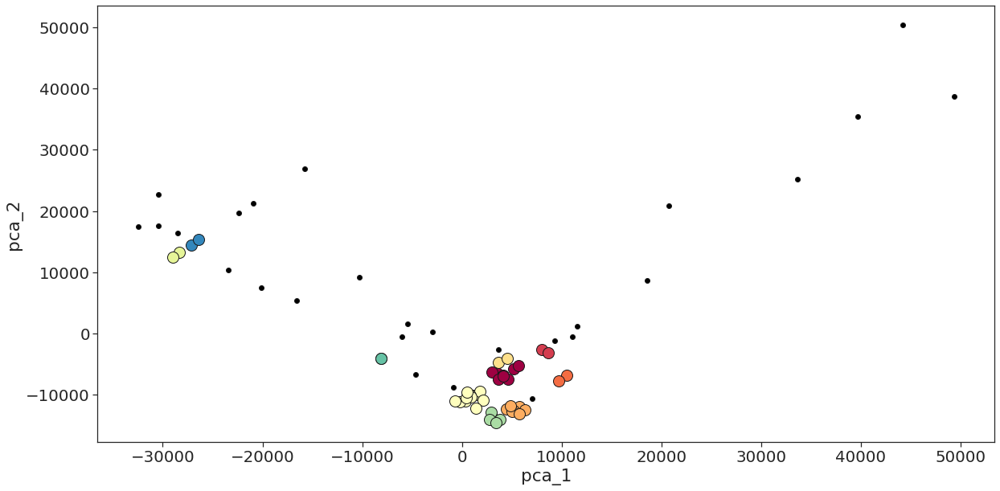

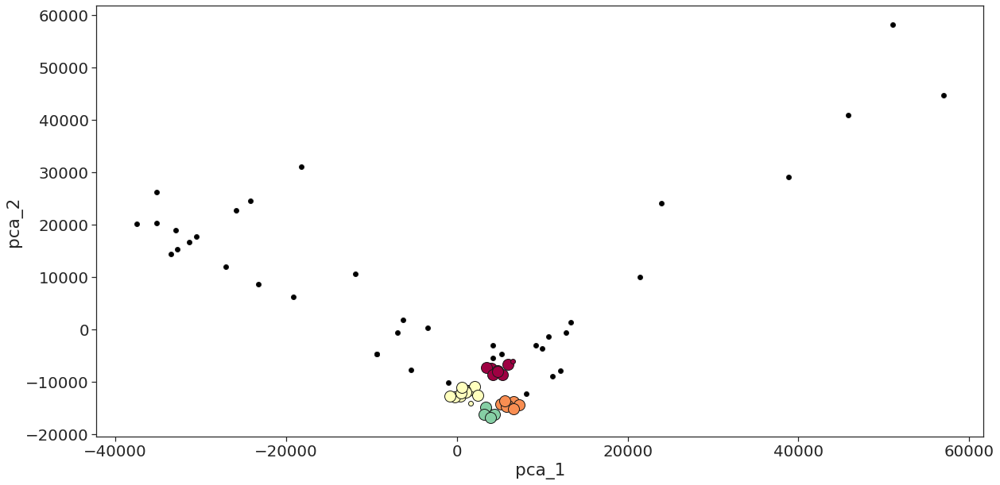

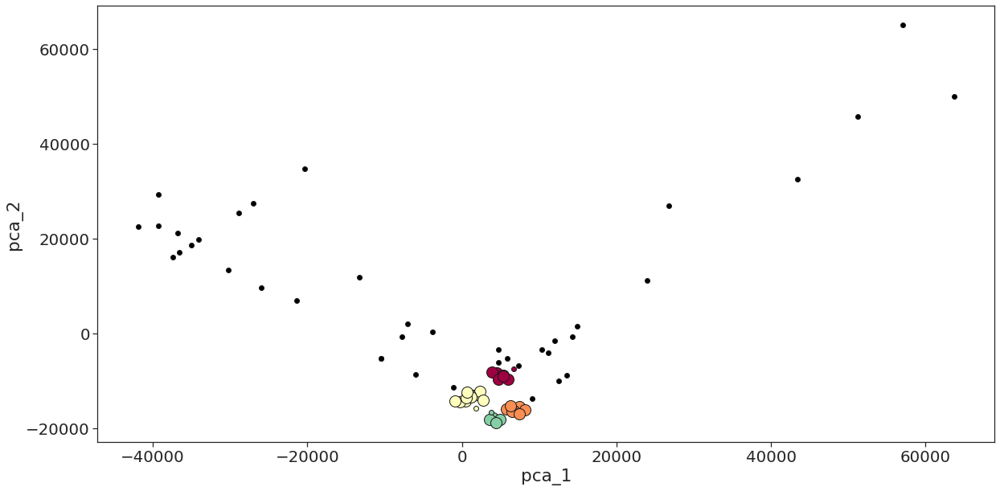

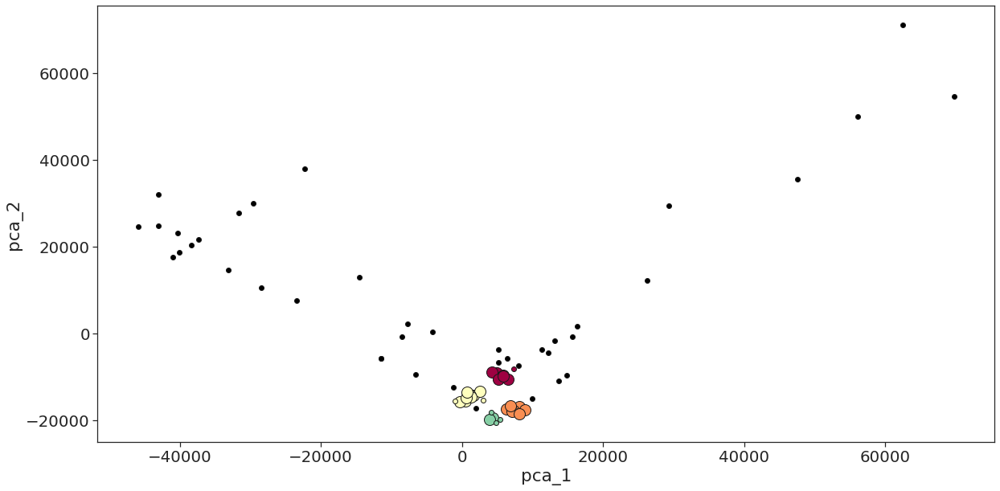

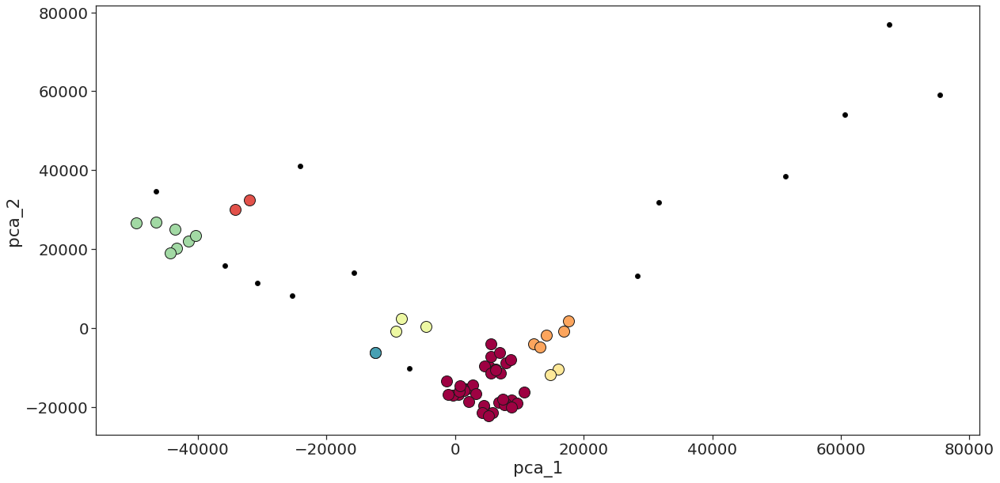

...

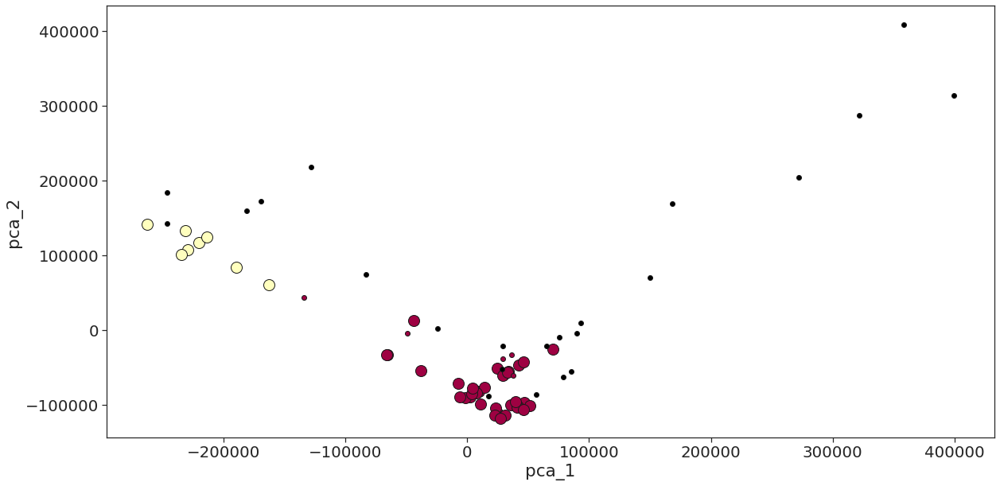

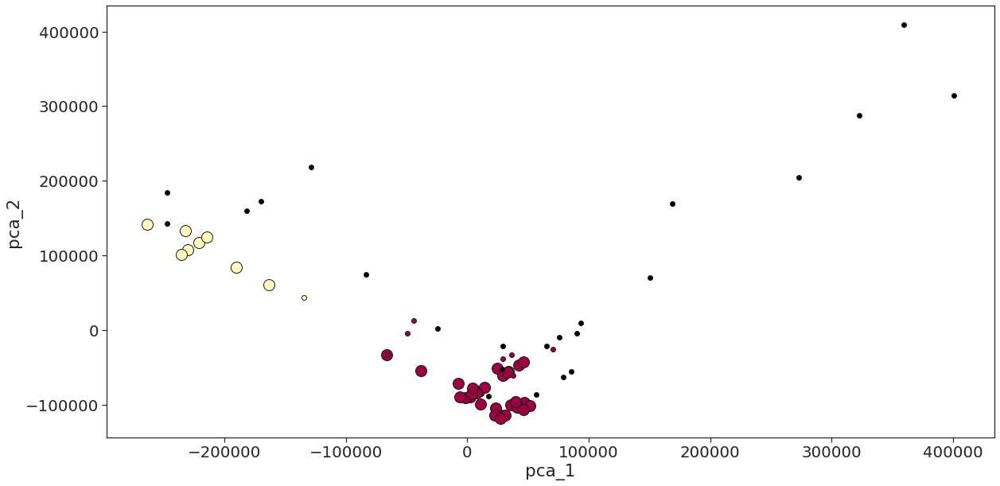

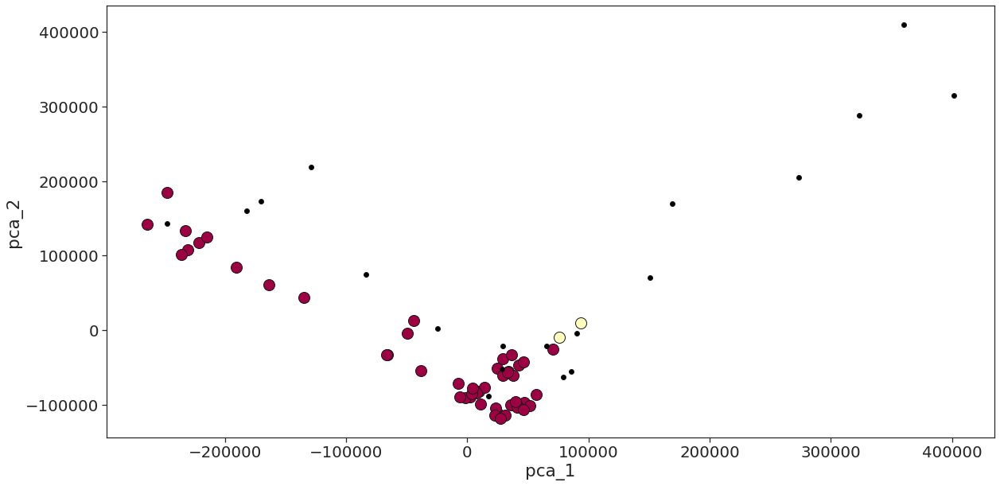

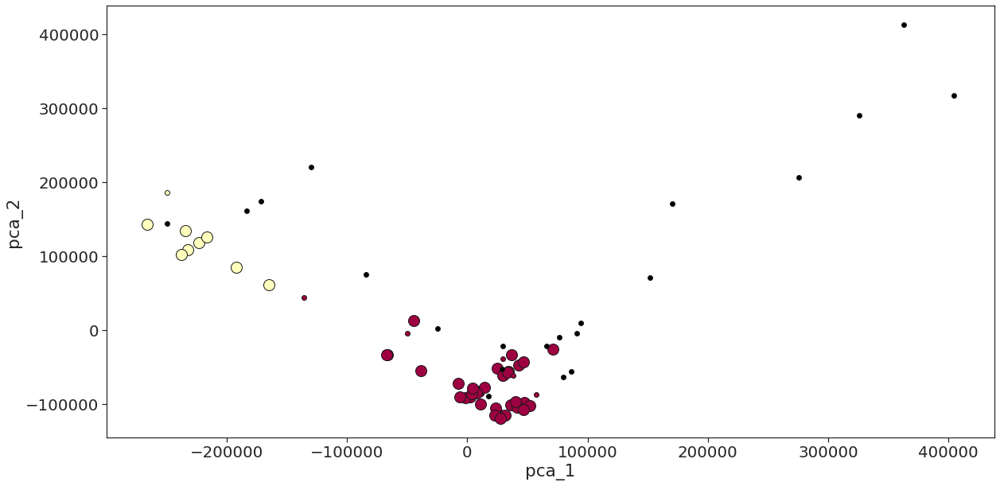

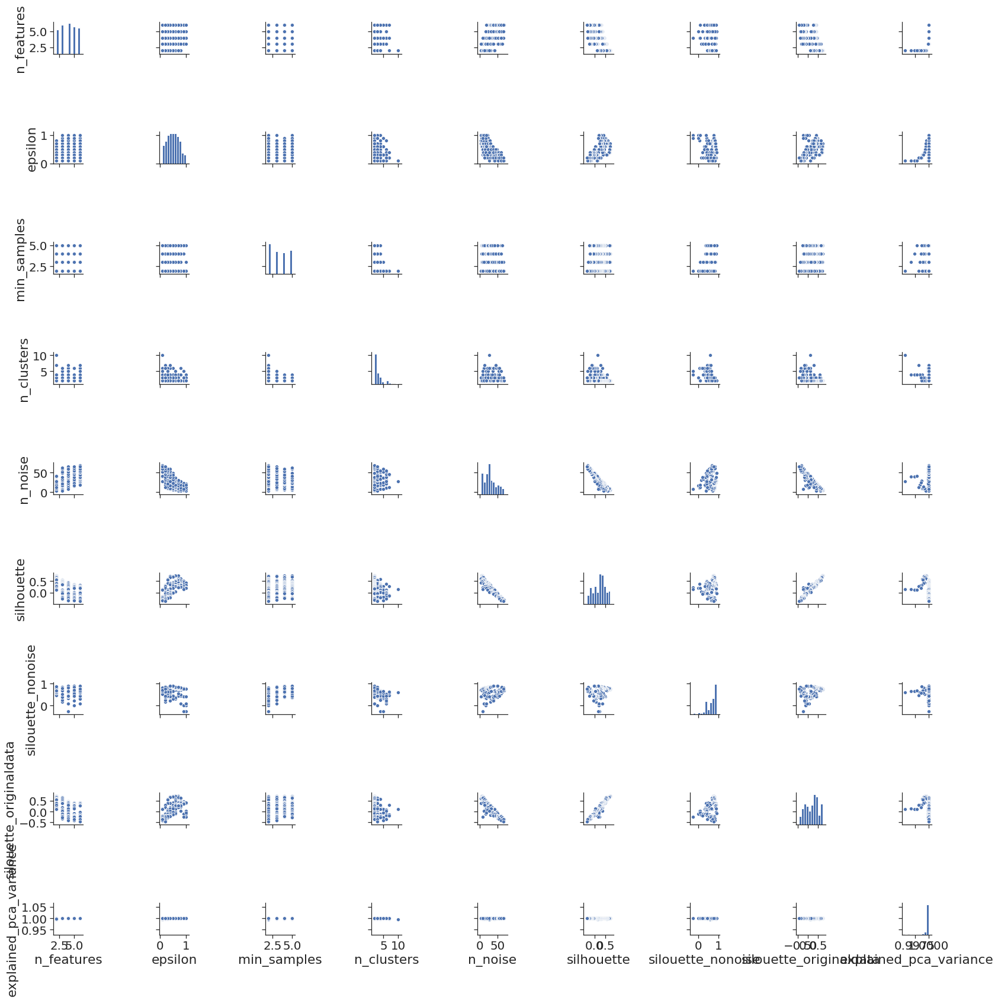

In [74]:
all_metrics = search_best(data)

In [75]:
all_metrics.sort_values(["silhouette", "silouette_nonoise"], ascending=False)

,n_features,epsilon,min_samples,n_clusters,n_noise,silhouette,silouette_nonoise,silouette_originaldata,explained_pca_variance
22,2,0.6,4,2,6,0.727328,0.757247,0.727897,0.999479
21,2,0.6,3,2,6,0.727328,0.757247,0.727876,0.999457
20,2,0.6,2,2,6,0.727328,0.757247,0.727853,0.999433
25,2,0.7,5,2,5,0.725206,0.742011,0.727387,0.999565
23,2,0.6,5,2,7,0.715286,0.773284,0.715716,0.999499
...,...,...,...,...,...,...,...,...,...
95,5,0.2,3,3,61,-0.300639,0.836784,-0.400482,0.999999
123,6,0.1,2,2,68,-0.308388,0.695143,-0.345765,1.000000
59,4,0.1,2,5,59,-0.314278,0.655119,-0.401298,0.999994
93,5,0.1,2,3,65,-0.318918,0.706808,-0.355757,0.999999


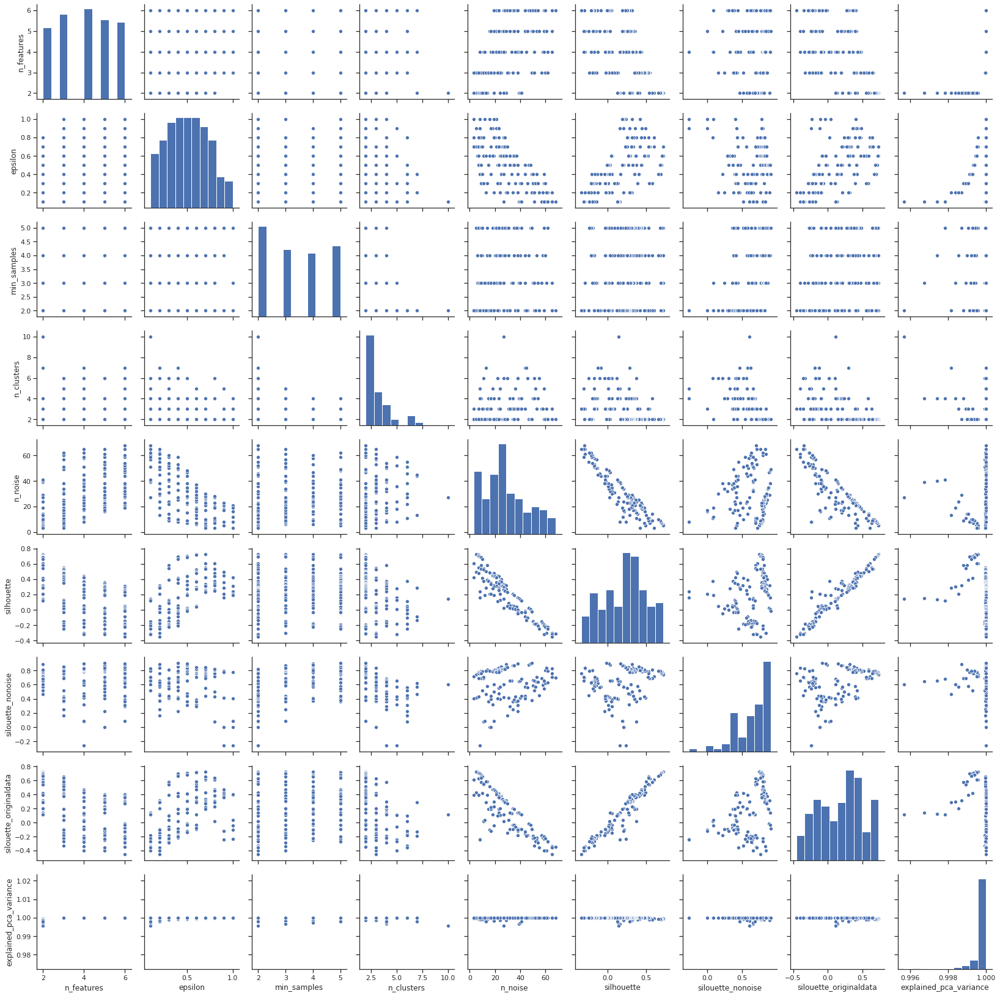

In [83]:
import seaborn as sns
sns.set(style="ticks",font_scale = 1)

sns.pairplot(all_metrics)
plt.savefig("reports/clustering/DBSCAN_metrics.png")

/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/plombao/miniconda3/envs/ds/lib/python3.8/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Metrics:
{'n_features': 2, 'epsilon': 0.6, 'min_samples': 4, 'n_clusters': 2, 'n_noise': 6, 'silhouette': 0.7273283759354121, 'silouette_nonoise': 0.7487479381729641, 'silouette_originaldata': 0.7193673515999558, 'explained_pca_variance': 0.9905555214122619}


<Figure size 1440x1440 with 0 Axes>

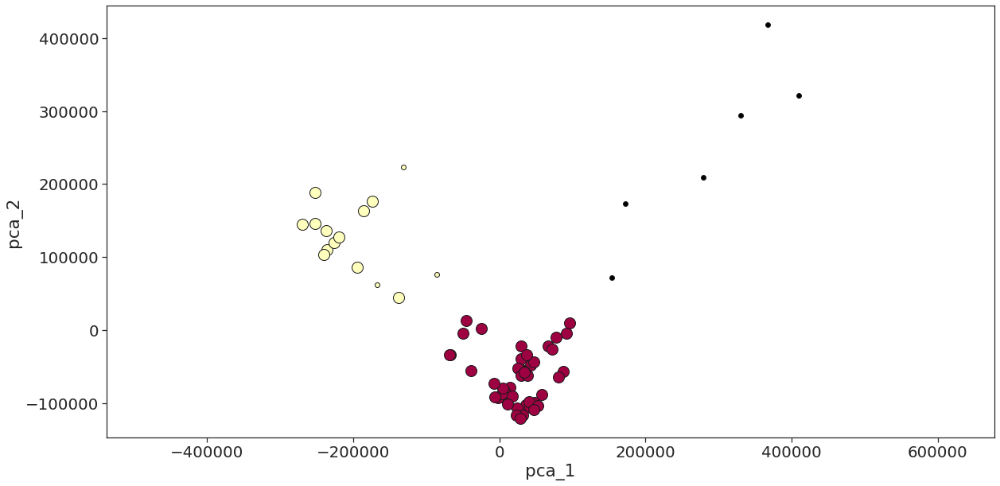

In [84]:
sns.set(style="ticks",font_scale = 1.8)
metrics, results = train_DBSCAN(data, 2, 0.6, 4)
plt.figure(figsize=(20,20))
plot_cluster(results)
plt.axis("equal")
plt.savefig("reports/clustering/DBSCAN_best_model.png")

In [12]:
results

,intermitencia,venta_median,venta_q95,venta_iqr,venta_CV,pca_1,pca_2,labels,core_samples,class_member_mask,pca_3,pca_4,pca_5,pca_6
producto,,,,,,,,,,,,,,
1,112358.744395,1889.0,12232.80,5668.00,1.480100,-7.954550e+04,157313.965408,-1,False,True,25715.971734,-6021.847437,9.196262,-0.499862
10,128709.278351,1792.5,5186.75,3032.50,0.919488,1.532061e+05,57292.773880,-1,False,True,1453.575951,4775.130373,-1.920346,-0.672241
11,110867.256637,1653.0,4408.00,2204.00,1.178873,-9.957776e+04,39637.426089,0,True,False,-464.214500,294.001022,-6.647331,-0.215360
12,107076.923077,870.0,1833.05,814.25,0.775033,-1.528660e+05,-3819.521928,1,True,False,-1188.220131,-1052.178151,-10.410562,0.337974
13,128709.278351,1549.0,3856.00,2442.50,0.875646,1.534132e+05,36516.606342,-1,False,True,-560.725509,5565.630932,-6.071709,-0.646039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,319792.207792,0.0,376.35,3.75,2.510755,2.863002e+06,1474.741741,-1,False,True,-5499.760738,1103.941101,6.218035,1.368650
96,104400.000000,274.5,720.55,418.25,0.878619,-1.906148e+05,-22536.942920,1,True,False,2255.552739,-43.510138,20.653202,2.724404
97,123002.955665,268.0,737.35,433.25,0.930844,7.310923e+04,-19523.056497,2,True,False,1641.779727,329.434506,-12.524838,0.314263


In [13]:
results.loc[results.labels == 0].index

Index(['11', '14', '17', '18', '19', '24', '5', '9'], dtype='object', name='producto')

In [14]:
results.loc[results.labels == 1].index

Index(['12', '21', '22', '26', '30', '31', '32', '35', '36', '38', '40', '42',
       '43', '45', '46', '48', '49', '50', '52', '53', '55', '59', '60', '61',
       '62', '63', '64', '66', '67', '68', '69', '72', '77', '79', '84', '87',
       '94', '96', '98'],
      dtype='object', name='producto')

In [15]:
results.loc[results.labels == 2].index

Index(['37', '57', '58', '73', '78', '85', '88', '89', '91', '97'], dtype='object', name='producto')